In [1]:
import numpy as np
import xarray as xr 
import matplotlib.pyplot as plt 
from scipy import special
import math 
import matplotlib.colors as colors

In [12]:
from datetime import datetime
from datetime import timedelta

In [15]:
a = datetime.strptime('2019-01-01', '%Y-%m-%d')
b = datetime.strptime('2019-12-31', '%Y-%m-%d')

t0 = np.datetime64(str(2019)) + np.timedelta64(0, 'D')
tb = t0 + np.timedelta64(365,'D')

dates_range = np.arange(t0, tb, dtype='datetime64[D]')

# Filter for winter months (December, January, February, March)
winter_months = [12, 1, 2, 3]
winter_dates = np.array([date for date in dates_range if date.astype('datetime64[M]').astype(int) % 12 + 1 in winter_months])


In [18]:
dates_range[0].astype('datetime64[M]').astype(int)

588

In [20]:
588 % 12

0

In [2]:
fn = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/fltano120/olr.fltano120.1978to2023based1979to2012.nc'
ds = xr.open_dataset(fn)
ds 

<xarray.Dataset>
Dimensions:    (time: 16161, lon: 180, lat: 91)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01 1979-01-02 ... 2023-03-31
  * lon        (lon) float32 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * lat        (lat) float32 90.0 88.0 86.0 84.0 ... -84.0 -86.0 -88.0 -90.0
    dayofyear  (time) int64 ...
Data variables:
    olr        (time, lat, lon) float64 ...

In [5]:
ds_sel = ds.sel(time=ds['time'].dt.month.isin([1,2,3,12]))
ds_sel 

<xarray.Dataset>
Dimensions:    (time: 5425, lon: 180, lat: 91)
Coordinates:
  * time       (time) datetime64[ns] 1979-01-01 1979-01-02 ... 2023-03-31
  * lon        (lon) float32 0.0 2.0 4.0 6.0 8.0 ... 352.0 354.0 356.0 358.0
  * lat        (lat) float32 90.0 88.0 86.0 84.0 ... -84.0 -86.0 -88.0 -90.0
    dayofyear  (time) int64 ...
Data variables:
    olr        (time, lat, lon) float64 ...

In [2]:
import torch

#from torchinfo import summary
import numpy as np
import sys
# import netCDF4 as nc
# from saveNCfile import savenc
# from saveNCfile_for_activations import savenc_for_activations
from data_loader_loop import load_test_data
# import hdf5storage
import xarray as xr 
import os 
from datetime import date 
from projection import projection


2.0.0+cu117


In [7]:
# calculate the (m,k) field for input maps
def get_input_map(vn):

    p = ''   # Monte Carlo Dropout rate = mcdp * 1%

    ysta = int(1979)  # training starts
    yend = int(2015)  # training ends

    testystat = int(2015)  # validation starts
    testyend = int(2020)  # validation ends

    leadmjo = int(10) # lead for output (the MJO index)
    nmem = int(1)  # the number of how many days we want to include into the input maps

    zmode = int(1)  # selected verticla mode 

    m = int(1)  # number of meridional modes
    mflg = 'off'  # flaf of m. only use odd/even modes to reconstruct OLR. 
    wnx = int(1)  # zonal wavenumber included
    wnxflg = 'off'  # flag of wnx

    # m = int(6)  # number of meridional modes
    # mflg = 'resi'  # flaf of m. only use odd/even modes to reconstruct OLR. 
    # wnx = int(10)  # zonal wavenumber included
    # wnxflg = 'resi'  # flag of wnx

    lat_lim = int(20)  # maximum latitude in degree

    mjo_ind = 'RMM'  # RMM or ROMI

    nmaps = 1

    datadir = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/'

    if mjo_ind=='RMM':
        Fnmjo = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/rmm/full/RMM_ERA5_daily_1979to2012.nc'
    elif mjo_ind=='ROMI':
        Fnmjo = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/rmm/full/ROMI_ERA5_daily_1979to2021.nc'

    data_save = '/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/'
    # data_save = './test_'

    # path_forecasts = data_save + 'output/'
    path_forecasts = './test_output/'
    model_save = data_save + 'modelsave/'
    pic_save = data_save + 'picsave/'

    os.makedirs(path_forecasts, exist_ok=True)
    os.makedirs(model_save, exist_ok=True)
    os.makedirs(pic_save, exist_ok=True)

    mem_list = np.arange(nmem)

    print('Model starts')

    psi_test_input_Tr_torch, psi_test_label_Tr_torch, psi_test_label_Tr, M, c  = load_test_data(vn,Fnmjo,leadmjo,mem_list,testystat,testyend,zmode,m,mflg,wnx,wnxflg,lat_lim,mjo_ind,pic_save)
    psi_test_input_Tr_torch_norm = np.zeros(np.shape(psi_test_input_Tr_torch))

    for leveln in np.arange(0,nmem):
        M_test_level = torch.mean(torch.flatten(psi_test_input_Tr_torch[:,leveln,:,:]))
        STD_test_level = torch.std(torch.flatten(psi_test_input_Tr_torch[:,leveln,:,:]))
        psi_test_input_Tr_torch_norm[:,leveln,None,:,:] = ((psi_test_input_Tr_torch[:,leveln,None,:,:]-M_test_level)/STD_test_level)

    psi_test_input_Tr_torch  = torch.from_numpy(psi_test_input_Tr_torch_norm).float()

    return psi_test_input_Tr_torch



In [8]:
zmode = 1

In [9]:
# function to get m coefficients
def get_um(u):
    # u has a shape of [batch_size, filters, lat, longitude]
    # do meridional projection on each longitude for each activations
    lat = np.arange(20,-22,-2)

    # parameters
    N = 1e-2  # buoyancy frequency (s-1)
    H = 1.6e4  # tropopause height (m)
    beta= 2.28e-11  # variation of coriolis parameter with latitude
    g = 9.8  # gravity acceleration 
    theta0 = 300  # surface potential temperature (K)
    c = N * H / np.pi / zmode # gravity wave speed
    L = np.sqrt(c / beta)  # horizontal scale (m)

    # define y = lat * 110 km / L
    y = lat * 110 * 1000 / L # dimensionless

    # define meridianol wave structures
    phi = []

    for i in np.arange(len(lat)):
        p = special.hermite(i)
        Hm = p(y)
        phim = np.exp(- y**2 / 2) * Hm / np.sqrt((2**i) * np.sqrt(np.pi) * math.factorial(i))

        phi.append(np.reshape(phim, (1, 1, len(y), 1)))

    # projection coefficients
    um = np.zeros((u.shape[0], u.shape[1], len(lat), u.shape[-1]))

    dy = (lat[0] - lat[1]) * 110 * 1000 / L 

    for i in range(len(lat)):
        um0 = np.sum(u * phi[i] * dy, axis=2, keepdims=True)  # (time, 1, lon)
        um[:,:,i,None,:] = um0

    return um

In [19]:
import sys
import numpy as np
import pandas as pd  
import xarray as xr 
import dask
from scipy import special
import math 
import matplotlib.pyplot as plt 
import os 

def projection(vn, cflg='None', m=1, mflg='off', wnx=10, wnxflg='all', time_range=['1979-01-01','2019-12-31'], lat_range=[90, -90], pic_save='./'):
    # zmode: the vertical mode, default m = 1
    # m: wave truncation
    # wnx: zonal wave number truncation [inclusive]
    # time_range: the time range of the data used in training and validating the model [inclusive]
    # lat_range: the latitude range (y) of the data used in projection

    # read data; any file with olr[time, lat, lon]
    fn = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/fltano120/'+vn+'.fltano120.1978to2023based1979to2012.nc'
    ds = xr.open_dataset(fn)

    ds1 = ds.sel(time=slice(time_range[0], time_range[1]), lat=slice(lat_range[0], lat_range[1]))

    olr = ds1[vn].values  # (time, lat, lon)
    lat = ds1['lat']
    lon = ds1['lon'].values
    time = ds1['time'].values

    if mflg=='off':
        olr_re = np.copy(olr)  # no dimension reduction on the meridional direction. 
    else:  
        # parameters
        N = 1e-2  # buoyancy frequency (s-1)
        H = 1.6e4  # tropopause height (m)
        beta= 2.28e-11  # variation of coriolis parameter with latitude
        g = 9.8  # gravity acceleration 
        theta0 = 300  # surface potential temperature (K)
        zmode=1
        c = N * H / np.pi / zmode # gravity wave speed

        L = np.sqrt(c / beta)  # horizontal scale (m)
    
        # define y = lat * 110 km / L
        y = lat.values * 110 * 1000 / L # dimensionless

        # define meridianol wave structures
        phi = []

        # define which equatorial wave is included in the reconstructed map
        # m is analogous to a meridional wavenumber
        # m = 0: mostly Kelvin wave
        # m = 2: mostly Rossby wave

        if mflg=='odd':
            m_list = np.arange(1,m,2)  
        elif mflg=='even':
            m_list = np.arange(0,m,2)
        elif mflg=='all':
            m_list = np.arange(m)
        elif mflg=='one':
            m_list = [m-1]
        elif mflg=='1pls':
            m_list = [0,m-1]
        elif mflg=='no1':
            m_list = np.arange(1,m)
        elif mflg=='resi':
            m_list = np.arange(m)  # this is the part to be removed from filtered map
        else:
            print('wrong m flag!')
            exit()

        for i in m_list:
            p = special.hermite(i)
            Hm = p(y)
            phim = np.exp(- y**2 / 2) * Hm / np.sqrt((2**i) * np.sqrt(np.pi) * math.factorial(i))

            phi.append(np.reshape(phim, (1, len(y), 1)))

        # projection coefficients
        olrm = []

        dy = (lat[0].values - lat[1].values) * 110 * 1000 / L 

        for i in range(len(m_list)):
            um = np.sum(olr * phi[i] * dy, axis=1, keepdims=True)  # (time, 1, lon)
            olrm.append(um)

        # reconstruction 
        olr_re = np.zeros(np.shape(olr))  # (time, lat, lon)

        for i in range(len(m_list)):
            olr_re = olr_re + olrm[i] * phi[i]
        
        if mflg=='resi':
            olr_re1 = olr - olr_re
            del olr_re
            olr_re = np.copy(olr_re1)
            del olr_re1

    if wnxflg=='off':
        olr_re_fft = np.copy(olr_re)
    else:
        # do fourier transform along each latitude at each time step
        coef_fft = np.fft.rfft(olr_re, axis=2)
        # remove waves whose zonal wave cycles are larger than wnx
        if wnxflg=='all':
            coef_fft[:,:,wnx+1:] = 0.0 
        elif wnxflg=='one':
            coef_fft[:,:,:wnx] = 0.0
            coef_fft[:,:,wnx+1:] = 0.0 
        elif wnxflg=='no0':  # include 1, 2, ..., wnx
            coef_fft[:,:,wnx+1:] = 0.0 
            coef_fft[:,:,0] = 0.0
        elif wnxflg=='no0p7': # include 1, 2, ..., wnx, 7
            coef_fft[:,:,wnx+1:7] = 0.0 
            coef_fft[:,:,8:] = 0.0 
            coef_fft[:,:,0] = 0.0
        elif wnxflg=='resi':  # resi of 0-wnx[inclusive]
             coef_fft[:,:,:wnx+1] = 0.0
        else:
            print('wrong wnx flag!')
            exit()
        # reconstruct OLR with selected zonal waves
        olr_re_fft = np.fft.irfft(coef_fft, np.shape(olr_re)[2], axis=2)

    fig_file_path = pic_save+vn+str(lat_range[0])+'deg_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_c'+str(int(math.floor(c)))+'.jpg'
    if not os.path.exists(fig_file_path):  # create a snapshot of the input map if the file does not exist. 
        # save the OLR maps at the first time step
        fig, ax = plt.subplots(2,1)
        fig.set_figheight(6)
        fig.set_figwidth(12)

        # fig1: reconstructed OLR after zonal fft
        im = ax[0].contourf(lon, lat.values, olr_re_fft[0,:,:])
        ax[0].set_xlabel('longitude')
        ax[0].set_ylabel('latitude')
        plt.colorbar(im, ax=ax[0])
        ax[0].set_title('filtered+Yproj_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg)

        # fig2: filtered OLR - reconstructed OLR after zonal fft
        tmp = olr[0,:,:] - olr_re_fft[0,:,:] 
        im = ax[1].contourf(lon, lat.values, tmp)
        ax[1].set_xlabel('longitude')
        ax[1].set_ylabel('latitude')
        plt.colorbar(im, ax=ax[1])
        ax[1].set_title('information missing from the filtered map')

        plt.subplots_adjust(hspace=0.4)

        fig.savefig(fig_file_path)

    return olr_re_fft  # (time, lat, lon)



In [ ]:
data = get_input_map('olr')   # [batch_size, channels, latitude, longitude]
# meridional projection
data_m = projection('olr', m=1, mflg='off', wnx=10, wnxflg='all', time_range=['1979-01-01','2019-12-31'], lat_range=[90, -90], pic_save='./') # get m coefficents [batch_size, channels, m, longitude]

In [10]:
# ####### hidden4 ##########
data = get_input_map('olr')   # [batch_size, channels, latitude, longitude]
# meridional projection
data_m = get_um(data.numpy()) # get m coefficents [batch_size, channels, m, longitude]
# zonal FFT
data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]


Model starts
combined input shape is: (1, 21, 180)


In [18]:
np.shape(pw_fft)

(1826, 1, 21, 91)

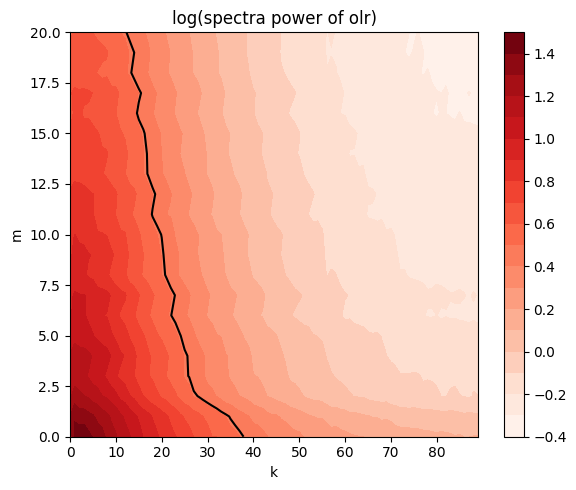

In [12]:
# Create a figure and axes
fig, axes = plt.subplots(1, 1, figsize=(6, 5))

kmax = 90
# Iterate over varn and plot each mk field
data = pw_fft

data1 = np.log10(np.mean(data, axis=0).squeeze()) 

im = axes.contourf(np.arange(kmax), np.arange(21), data1[:,:kmax], levels=20, cmap='Reds')
axes.contour(np.arange(kmax), np.arange(21), data1[:,:kmax], levels=[np.max(data1[:,:kmax])-1], colors='black')
axes.set_title(f'log(spectra power of olr)')
axes.set_xlabel('k')
axes.set_ylabel('m')
plt.colorbar(im, ax=axes)        

# Adjust the spacing between subplots
fig.tight_layout()

# Show the figure
plt.show()


In [10]:

varn = [
    "olr", "tcwv", "prep",
    "u200", "u500", "u850",  
    "q200", "q500", "q850", 
    "T200", "T500", "T850", 
    "Z200", "Z500", "Z850", 
    "v200", "v500", "v850", 
    "sst" # 
]

mkfields = {}

for vn in varn:
    data = get_input_map(vn)  # [batch_size, channels, latitude, longitude]
    # meridional projection
    data_m = get_um(data.numpy()) # get m coefficients [batch_size, channels, m, longitude]
    # zonal FFT
    data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
    pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]
    # initialize the list if it doesn't exist
    if vn not in mkfields:
        mkfields[vn] = []
    # append to the mk field for the input layer
    mkfields[vn].append(pw_fft)


Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)
Model starts
combined input shape is: (1, 21, 180)


In [12]:
mkfields['olr'][0].shape

(1826, 1, 21, 91)

In [16]:
import pickle

# Store the dictionary using pickle
with open('./mkfields.pickle', 'wb') as file1:
    pickle.dump(mkfields, file1)


In [2]:
import pickle

# Load the dictionary from the file
with open('./mkfields.pickle', 'rb') as file1:
    mkfields = pickle.load(file1)


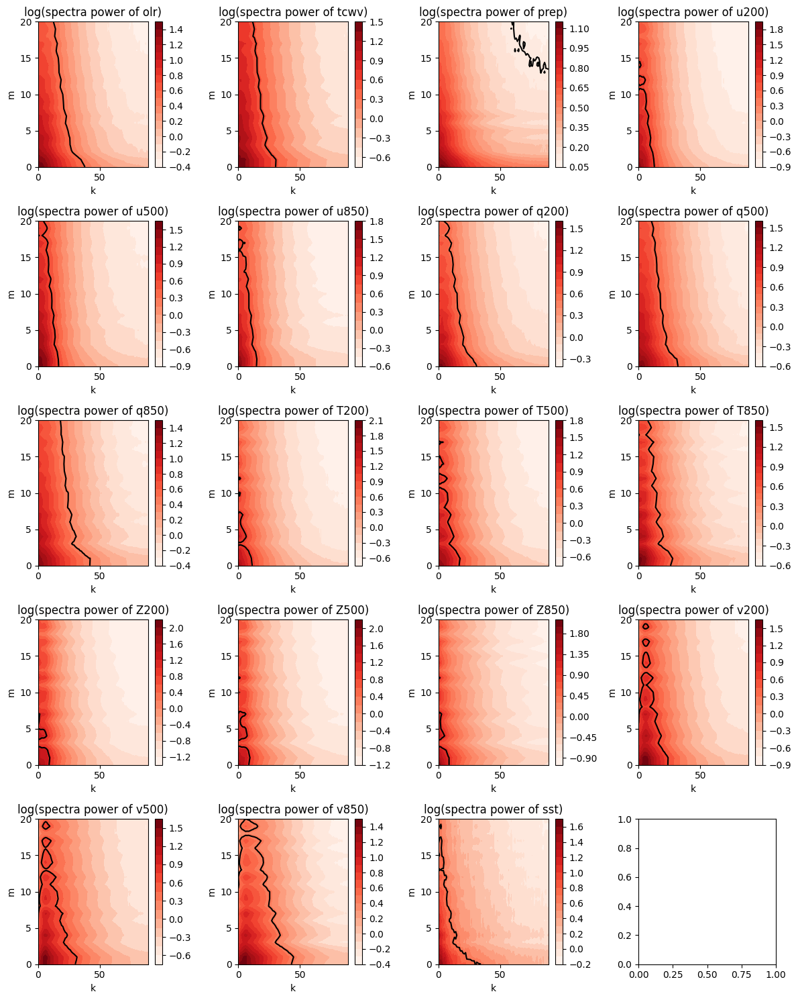

In [4]:
import matplotlib.pyplot as plt
varn = [
    "olr", "tcwv", "prep",
    "u200", "u500", "u850",  
    "q200", "q500", "q850", 
    "T200", "T500", "T850", 
    "Z200", "Z500", "Z850", 
    "v200", "v500", "v850", 
    "sst" # 
]

# Create a figure and axes
fig, axes = plt.subplots(5, 4, figsize=(12, 15))

# Flatten the axes array to iterate over it
axes = axes.flatten()

kmax = 90
# Iterate over varn and plot each mk field
for i, vn in enumerate(varn):
    # Get the data for vn
    data = mkfields[vn][0]

    data1 = np.log10(np.mean(data, axis=0).squeeze()) 

    im = axes[i].contourf(np.arange(kmax), np.arange(21), data1[:,:kmax], levels=20, cmap='Reds')
    axes[i].contour(np.arange(kmax), np.arange(21), data1[:,:kmax], levels=[np.max(data1[:,:kmax])-1], colors='black')
    axes[i].set_title(f'log(spectra power of {vn})')
    axes[i].set_xlabel('k')
    axes[i].set_ylabel('m')
    plt.colorbar(im, ax=axes[i])        

# Adjust the spacing between subplots
fig.tight_layout()

# Show the figure
plt.show()


In [3]:
# define the model architecture
import torch
print(torch.__version__)

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
#from torchinfo import summary
import numpy as np
import sys
# import netCDF4 as nc
# from saveNCfile import savenc
# from saveNCfile_for_activations import savenc_for_activations
from data_loader_loop import load_test_data
# import hdf5storage
import xarray as xr 
import os 
from datetime import date 
from projection import projection

print('Code starts')
# April 18: project OLR onto meridional wave structures
# Updates Nov 13, 2022: Add 2dMonte
# input: 6 global maps at three time steps
# output: RMMERA5 at one time step

# parameters to be set
vn = 'olr'  # variable name

p = ''   # Monte Carlo Dropout rate = mcdp * 1%

ysta = int(1979)  # training starts
yend = int(2015)  # training ends

testystat = int(2015)  # validation starts
testyend = int(2020)  # validation ends

leadmjo = int(10) # lead for output (the MJO index)
nmem = int(1)  # the number of how many days we want to include into the input maps

zmode = int(1)  # selected verticla mode 

m = int(1)  # number of meridional modes
mflg = 'off'  # flaf of m. only use odd/even modes to reconstruct OLR. 
wnx = int(1)  # zonal wavenumber included
wnxflg = 'off'  # flag of wnx

# m = int(6)  # number of meridional modes
# mflg = 'resi'  # flaf of m. only use odd/even modes to reconstruct OLR. 
# wnx = int(10)  # zonal wavenumber included
# wnxflg = 'resi'  # flag of wnx

lat_lim = int(20)  # maximum latitude in degree

mjo_ind = 'RMM'  # RMM or ROMI

nmaps = 1

datadir = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/'

if mjo_ind=='RMM':
    Fnmjo = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/rmm/full/RMM_ERA5_daily_1901to2020.nc'
elif mjo_ind=='ROMI':
    Fnmjo = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/rmm/full/ROMI_ERA5_daily_1979to2021.nc'

data_save = '/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/'
# data_save = './test_'

# path_forecasts = data_save + 'output/'
path_forecasts = './test_output/'
model_save = data_save + 'modelsave/'
pic_save = data_save + 'picsave/'

os.makedirs(path_forecasts, exist_ok=True)
os.makedirs(model_save, exist_ok=True)
os.makedirs(pic_save, exist_ok=True)

mem_list = np.arange(nmem)

batch_size = 20
num_samples = 2
lambda_reg = 0.2

# model's hyperparameters
nhidden1=500
nhidden2=200
nhidden3=50

dimx = int(1 + 2 * int(lat_lim / 2))
dimy = 180

num_filters_enc = 64
num_filters_dec1 = 128
num_filters_dec2 = 192

featureDim=num_filters_dec2*dimx*dimy

# Generate MCDO masks
mcdo_masks_conv1 = 1
mcdo_masks_conv2 = 1
mcdo_masks_conv3 = 1
mcdo_masks_conv4 = 1
mcdo_masks_conv5 = 1
mcdo_masks_conv6 = 1
mcdo_masks_outline1 = 1
mcdo_masks_outline2 = 1
mcdo_masks_outline3 = 1

class CNN(nn.Module):
    def __init__(self,imgChannels=nmaps*nmem, out_channels=2):
        super().__init__()
        self.input_layer = (nn.Conv2d(imgChannels, num_filters_enc, kernel_size=5, stride=1, padding='same'))
        self.hidden1 = (nn.Conv2d(num_filters_enc, num_filters_enc, kernel_size=5, stride=1, padding='same' ))
        self.hidden2 = (nn.Conv2d(num_filters_enc, num_filters_enc, kernel_size=5, stride=1, padding='same' ))
        self.hidden3 = (nn.Conv2d(num_filters_enc, num_filters_enc, kernel_size=5, stride=1, padding='same' ))
        self.hidden4 = (nn.Conv2d(num_filters_enc, num_filters_enc, kernel_size=5, stride=1, padding='same' ))


        self.hidden5 = (nn.Conv2d(num_filters_dec1, num_filters_dec1, kernel_size=5, stride=1, padding='same' ))
        self.hidden6 = (nn.Conv2d(num_filters_dec2, num_filters_dec2, kernel_size=5, stride=1, padding='same' ))

        self.FC1 = nn.Linear(featureDim,nhidden1)
        self.FC2 = nn.Linear(nhidden1,nhidden2)
        self.FC3 = nn.Linear(nhidden2,nhidden3)
        self.FC4 = nn.Linear(nhidden3,out_channels)

        self.dropoutconv1 = nn.Dropout2d(p=0.1)
        self.dropoutconv2 = nn.Dropout2d(p=0.1)
        self.dropoutconv3 = nn.Dropout2d(p=0.1)
        self.dropoutconv4 = nn.Dropout2d(p=0.1)
        self.dropoutconv5 = nn.Dropout2d(p=0.1)
        self.dropoutconv6 = nn.Dropout2d(p=0.1)
        self.dropoutline1 = nn.Dropout(p=0.2)
        self.dropoutline2 = nn.Dropout(p=0.2)
        self.dropoutline3 = nn.Dropout(p=0.2)
        

    def forward (self,x):

        x1 = F.relu (self.dropoutconv1(self.input_layer(x)) * mcdo_masks_conv1)
        x2 = F.relu (self.dropoutconv2(self.hidden1(x1)) * mcdo_masks_conv2)
        x3 = F.relu (self.dropoutconv3(self.hidden2(x2)) * mcdo_masks_conv3)
        x4 = F.relu (self.dropoutconv4(self.hidden3(x3)) * mcdo_masks_conv4)

        x5 = torch.cat ((F.relu(self.dropoutconv5(self.hidden4(x4)) * mcdo_masks_conv5),x3), dim =1)
        x6 = torch.cat ((F.relu(self.dropoutconv6(self.hidden5(x5)) * mcdo_masks_conv6),x2), dim =1)
        x6 = x6.view(-1,featureDim)
        x6 = F.relu(self.FC1(x6))
        x7 = F.relu(self.FC2(self.dropoutline1(x6) * mcdo_masks_outline1))
        x8 = F.relu(self.FC3(self.dropoutline2(x7) * mcdo_masks_outline2))

        out = (self.FC4(self.dropoutline3(x8) * mcdo_masks_outline3))

        return out

net = CNN()  


2.0.0+cu117
2.0.0+cu117
Code starts


In [5]:
# look the (m,k) field at each layer
# 1. extract the target activations whose size is [batch_size, channels, latitude, longitude] on one layer 
# 2. get the (m,k) field for the target activations 
# 3. iterate #1-2 for each layer

# each layer's name: 
layer_name = ['input_map','input_layer','hidden1','hidden2','hidden3','hidden4','hidden5']
nlayer = len(layer_name)
mkfields = {}  # name of each layer: its mk fields (dtype: list)
outfields = {}

# add hook
hook_outputs = {}

for layer in range(nlayer):
    mkfields[layer_name[layer]] = []
    outfields[layer_name[layer]] = []

# Define hook functions to retrieve the hidden layer outputs for each input
def hook_fn(module, input, output):
    hook_outputs[module] = output.data.cpu().numpy()

# Register hooks on desired layers for each input
net.input_layer.register_forward_hook(hook_fn)
net.hidden1.register_forward_hook(hook_fn)
net.hidden2.register_forward_hook(hook_fn)
net.hidden3.register_forward_hook(hook_fn)
net.hidden4.register_forward_hook(hook_fn)
net.hidden5.register_forward_hook(hook_fn)

net.cuda()  # send the net to GPU
# net.cuda(device=gpuid)
# gpuid = os.environ["SLURM_LOCALID"]

print('Model starts')

psi_test_input_Tr_torch, psi_test_label_Tr_torch, psi_test_label_Tr, M  = load_test_data(vn,Fnmjo,leadmjo,mem_list,testystat,testyend,zmode,m,mflg,wnx,wnxflg,lat_lim,mjo_ind,pic_save)
psi_test_input_Tr_torch_norm = np.zeros(np.shape(psi_test_input_Tr_torch))

for leveln in np.arange(0,nmem):
    M_test_level = torch.mean(torch.flatten(psi_test_input_Tr_torch[:,leveln,:,:]))
    STD_test_level = torch.std(torch.flatten(psi_test_input_Tr_torch[:,leveln,:,:]))
    psi_test_input_Tr_torch_norm[:,leveln,None,:,:] = ((psi_test_input_Tr_torch[:,leveln,None,:,:]-M_test_level)/STD_test_level)

psi_test_input_Tr_torch  = torch.from_numpy(psi_test_input_Tr_torch_norm).float()

print('shape of normalized input test',psi_test_input_Tr_torch.shape)
print('shape of normalized label test',psi_test_label_Tr_torch.shape)
###############################################################################

net.load_state_dict(torch.load(model_save+'predicted_MCDO_UNET_'+vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+'.pt'))
net.eval()

batch_size = 20
testing_data_loader = torch.utils.data.DataLoader(psi_test_input_Tr_torch, batch_size=batch_size, drop_last=True)

for batch in testing_data_loader:
    batch = batch.cuda()
    tmp = net(batch)

    # hidden_outputs contains activations on all layers {name: activations}
    # ####### input map ##########
    data = batch.data.cpu().numpy()  # [batch_size, channels, latitude, longitude]
    # meridional projection
    data_m = get_um(data) # get m coefficents [batch_size, channels, m, longitude]
    # zonal FFT
    data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
    pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]
    # append to the mk field for the input layer
    mkfields['input_map'].append(pw_fft)
    outfields['input_map'].append(data)

    # ####### input layer ##########
    data = hook_outputs[net.input_layer]  # [batch_size, channels, latitude, longitude]
    # meridional projection
    data_m = get_um(data) # get m coefficents [batch_size, channels, m, longitude]
    # zonal FFT
    data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
    pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]
    # append to the mk field for the input layer
    mkfields['input_layer'].append(pw_fft)
    outfields['input_layer'].append(data)

    # ####### hidden1 ##########
    data = hook_outputs[net.hidden1]  # [batch_size, channels, latitude, longitude]
    # meridional projection
    data_m = get_um(data) # get m coefficents [batch_size, channels, m, longitude]
    # zonal FFT
    data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
    pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]
    # append to the mk field for the input layer
    mkfields['hidden1'].append(pw_fft)
    outfields['hidden1'].append(data)

    # ####### hidden2 ##########
    data = hook_outputs[net.hidden2]  # [batch_size, channels, latitude, longitude]
    # meridional projection
    data_m = get_um(data) # get m coefficents [batch_size, channels, m, longitude]
    # zonal FFT
    data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
    pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]
    # append to the mk field for the input layer
    mkfields['hidden2'].append(pw_fft)
    outfields['hidden2'].append(data)
    
    # ####### hidden3 ##########
    data = hook_outputs[net.hidden3]  # [batch_size, channels, latitude, longitude]
    # meridional projection
    data_m = get_um(data) # get m coefficents [batch_size, channels, m, longitude]
    # zonal FFT
    data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
    pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]
    # append to the mk field for the input layer
    mkfields['hidden3'].append(pw_fft)
    outfields['hidden3'].append(data)

    # ####### hidden4 ##########
    data = hook_outputs[net.hidden4]  # [batch_size, channels, latitude, longitude]
    # meridional projection
    data_m = get_um(data) # get m coefficents [batch_size, channels, m, longitude]
    # zonal FFT
    data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
    pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]
    # append to the mk field for the input layer
    mkfields['hidden4'].append(pw_fft)
    outfields['hidden4'].append(data)

    # ####### hidden5 ##########
    data = hook_outputs[net.hidden5]  # [batch_size, channels, latitude, longitude]
    # meridional projection
    data_m = get_um(data) # get m coefficents [batch_size, channels, m, longitude]
    # zonal FFT
    data_m_fft = np.fft.rfft(data_m, axis=-1)  # [batch_size, filters, m, k]
    pw_fft = np.abs(data_m_fft)  # [batch_size, filters, m, k]
    # append to the mk field for the input layer
    mkfields['hidden5'].append(pw_fft)
    outfields['hidden5'].append(data)



Model starts
combined input shape is: (1, 21, 180)
shape of normalized input test torch.Size([1826, 1, 21, 180])
shape of normalized label test torch.Size([1826, 2])


KeyboardInterrupt: 

In [5]:
# The structure of mkfields
# 7 items ['input_map','input_layer','hidden1','hidden2','hidden3','hidden4','hidden5']
# each item is a list store activations for the item layer
# each list has 91 arrays to store activations of 91 batches
# each array contains activations for one batch

# store it
import pickle

# Store the dictionary using pickle
with open('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/hidden_layers/mkfields'+vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+'.pickle', 'wb') as file1:
    pickle.dump(mkfields, file1)

with open('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/hidden_layers/outfields'+vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+'.pickle', 'wb') as file2:
    pickle.dump(outfields, file2)


In [13]:
import pickle
import numpy as np
import xarray as xr 
import matplotlib.pyplot as plt 
from scipy import special
import math 
# parameters to be set
vn = 'olr'  # variable name

p = ''   # Monte Carlo Dropout rate = mcdp * 1%

ysta = int(1979)  # training starts
yend = int(2015)  # training ends

testystat = int(2015)  # validation starts
testyend = int(2020)  # validation ends

leadmjo = int(10) # lead for output (the MJO index)
nmem = int(1)  # the number of how many days we want to include into the input maps

zmode = int(1)  # selected verticla mode 

# m = int(6)  # number of meridional modes
# mflg = 'resi'  # flaf of m. only use odd/even modes to reconstruct OLR. 
# wnx = int(10)  # zonal wavenumber included
# wnxflg = 'resi'  # flag of wnx

m = int(1)  # number of meridional modes
mflg = 'off'  # flaf of m. only use odd/even modes to reconstruct OLR. 
wnx = int(1)  # zonal wavenumber included
wnxflg = 'off'  # flag of wnx

lat_lim = int(20)  # maximum latitude in degree

mjo_ind = 'RMM'  # RMM or ROMI

nmaps = 1

# Load the dictionary from the file
with open('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/hidden_layers/mkfields.pickle', 'rb') as file1:
    mkfields = pickle.load(file1)

with open('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/hidden_layers/outfields.pickle', 'rb') as file2:
    outfields = pickle.load(file2)

# # Load the dictionary from the file
# with open('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/hidden_layers/mkfields'+vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+'.pickle', 'rb') as file1:
#     mkfields = pickle.load(file1)

# with open('/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/hidden_layers/outfields'+vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+'.pickle', 'rb') as file2:
#     outfields = pickle.load(file2)


In [16]:
np.shape(mkfields['hidden1'])

(91, 20, 64, 21, 91)

In [2]:
# cluster filters on layers [hidden1 and hidden5] using k-means
from sklearn.cluster import KMeans
kmax = 30
layer_name = ['hidden1','hidden5']
epsilon = 1e-8
k_err = []

feature_matrix = []

for layer in layer_name:
    tmp = np.asarray(mkfields[layer])
    tmp1 = np.mean(tmp, axis=(0,1)).squeeze()
    tmp2 = tmp1.reshape((tmp1.shape[0],21*91))  # [filters, latitude*longitude]
    feature_matrix.append(tmp2)

feature_matrix1 = np.concatenate((feature_matrix[0],feature_matrix[1]), axis=0)
feature_matrix_norm = np.zeros(feature_matrix1.shape)

In [3]:
# normalize the feature matrix
for i in range(feature_matrix1.shape[0]):
    M_feature = np.min(feature_matrix1[i,:])
    std_feature = np.max(feature_matrix1[i,:]) - np.min(feature_matrix1[i,:])
    feature_matrix_norm[i,:] = (feature_matrix1[i,:] - M_feature) / std_feature
# for i in range(feature_matrix.shape[0]):
#     M_feature = np.mean(feature_matrix[i,:])
#     std_feature = np.std(feature_matrix[i,:])
#     feature_matrix_norm[i,:] = (feature_matrix[i,:] - M_feature) / std_feature

sse = []
for k in range(1,kmax+1):
    # create kmeans algorithm
    kmeans = KMeans(n_clusters=k, n_init=30).fit(feature_matrix_norm)
    # get the cluster labels for each sample
    labels = kmeans.labels_
    # get the cluster centroids
    centroids = kmeans.cluster_centers_

    curr_sse = 0

    # calculate within-cluster-sum squared error
    for i in range(feature_matrix_norm.shape[0]):
        curr_center = centroids[labels[i]]
        curr_sse += np.sum((feature_matrix_norm[i] - curr_center) ** 2)

    sse.append(curr_sse)

k_err.append(sse)
    

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


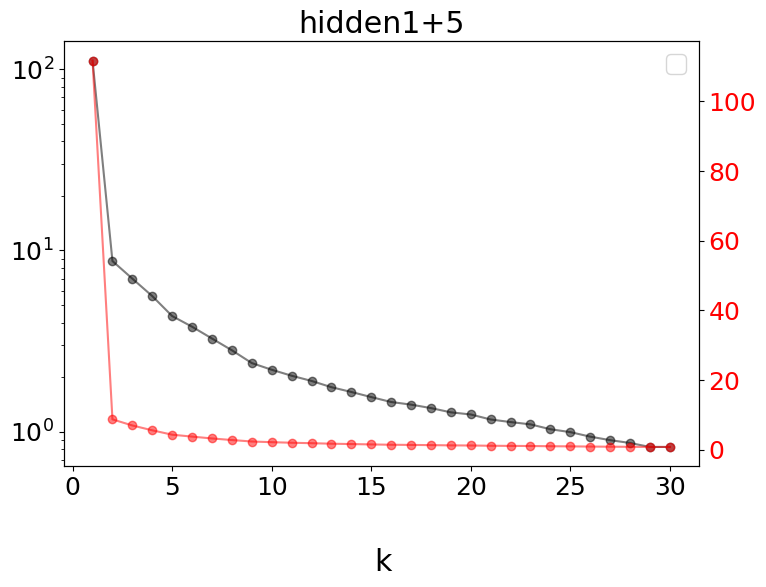

In [41]:
import matplotlib.pyplot as plt

# Assuming you have the following variables available:
# layer_name: List of layer names
# k_err: List of SSE values for each layer
# sse: List of SSE values

fig, axs = plt.subplots(1, 1, figsize=(8, 6))

# Plot with logarithmic scale
axs.plot(range(1, len(np.asarray(k_err).squeeze()) + 1), np.asarray(k_err).squeeze(), 'o-', color='black', alpha= 0.5)
axs.set_title('hidden1+5')
axs.set_yscale('log')

# Create a twin axes for linear scale
ax2 = axs.twinx()
ax2.plot(range(1, len(np.asarray(k_err).squeeze()) + 1), np.asarray(k_err).squeeze(), 'o-', color='red', alpha=0.5)
# ax2.set_ylabel('WSSE')
ax2.tick_params(axis='y', labelcolor='red')
ax2.set_yscale('linear')

fig.supxlabel('k')

# Place the legend on the right-y axis
axs.legend(loc='upper right')

plt.tight_layout()
plt.show()

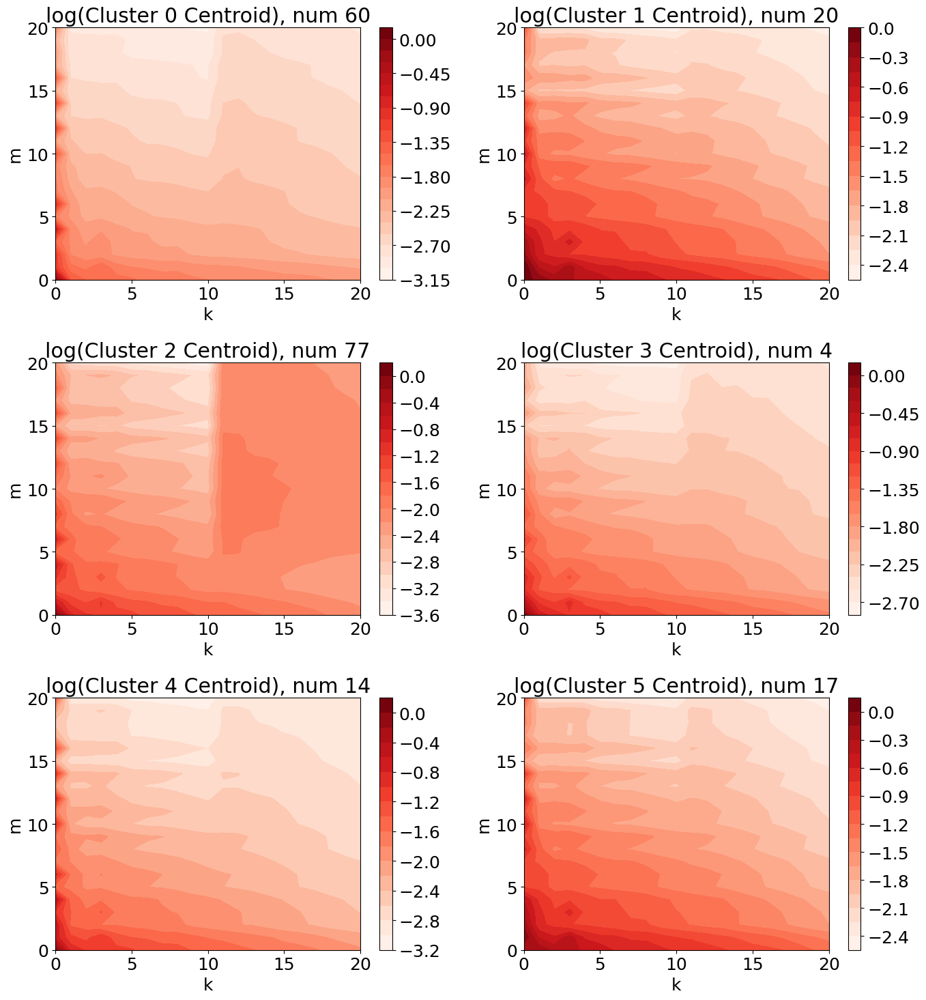

In [43]:
# choose k_cluster = 6
# cluster filters using k-means
from sklearn.cluster import KMeans
import matplotlib.ticker as ticker
import matplotlib.colors as colors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

kmax = 21

# Create the individual colormaps
cmap1 = plt.cm.Blues_r
cmap2 = plt.cm.Oranges_r
cmap3 = plt.cm.Greens_r
cmap4 = plt.cm.Reds_r
cmap5 = plt.cm.Purples_r

k_cluster = 6

# create kmeans algorithm
kmeans = KMeans(n_clusters=k_cluster, n_init=30).fit(feature_matrix_norm)
# get the cluster labels for each sample
labels = kmeans.labels_
# get the cluster centroids
centroids = kmeans.cluster_centers_

import matplotlib.pyplot as plt
import matplotlib.colors as colors

epsilon = 1e-8
x = np.bincount(labels)
# Define the number of levels for the colormap
num_levels = 20

# Define the logarithmic base
log_base = 10

# Visualize the cluster centroids
plt.rcParams.update({'font.size': 18})
plt.figure(figsize=(14, 2.5*k_cluster))

for i in range(k_cluster):
    # Calculate the logarithm of the centroid values using ln (natural logarithm)
    centroid_ln = centroids[i].reshape((21, 91)) + epsilon
    
    plt.subplot(int(k_cluster/2), 2, i+1)
    im = plt.contourf(np.arange(kmax), np.arange(21), np.log10(centroid_ln[:,:kmax]), levels=20, cmap='Reds')
    plt.title(f'log(Cluster {i} Centroid), num {x[i]}')
    plt.xlabel('k')
    plt.ylabel('m')
    plt.colorbar(im)        

plt.tight_layout()
plt.show()

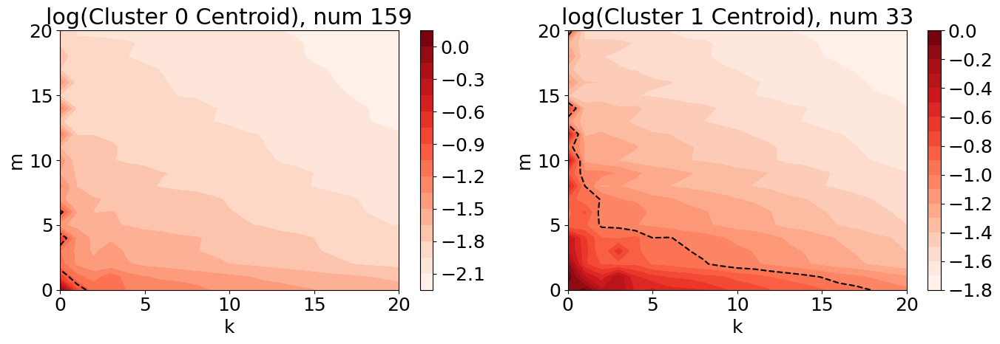

In [4]:
# choose k_cluster = 6
# cluster filters using k-means
from sklearn.cluster import KMeans
import matplotlib.ticker as ticker
import matplotlib.colors as colors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

kmax = 21

# Create the individual colormaps
cmap1 = plt.cm.Blues_r
cmap2 = plt.cm.Oranges_r
cmap3 = plt.cm.Greens_r
cmap4 = plt.cm.Reds_r
cmap5 = plt.cm.Purples_r

k_cluster = 2

# create kmeans algorithm
kmeans = KMeans(n_clusters=k_cluster, n_init=30).fit(feature_matrix_norm)
# get the cluster labels for each sample
labels = kmeans.labels_
# get the cluster centroids
centroids = kmeans.cluster_centers_

import matplotlib.pyplot as plt
import matplotlib.colors as colors

epsilon = 1e-8
x = np.bincount(labels)
# Define the number of levels for the colormap
num_levels = 20

# Define the logarithmic base
log_base = 10

# Visualize the cluster centroids
plt.rcParams.update({'font.size': 18})
plt.figure(figsize=(14, 2.5*k_cluster))

for i in range(k_cluster):
    # Calculate the logarithm of the centroid values using ln (natural logarithm)
    centroid_ln = centroids[i].reshape((21, 91)) + epsilon
    
    plt.subplot(int(k_cluster/2), 2, i+1)
    im = plt.contourf(np.arange(kmax), np.arange(21), np.log10(centroid_ln[:,:kmax]), levels=20, cmap='Reds')
    plt.contour(np.arange(kmax), np.arange(21), np.log10(centroid_ln[:, :kmax]), levels=[-1.0], colors='black')
    plt.title(f'log(Cluster {i} Centroid), num {x[i]}')
    plt.xlabel('k')
    plt.ylabel('m')
    plt.colorbar(im)        

plt.tight_layout()
plt.show()

In [24]:
# cluster filters on each layer using k-means
from sklearn.cluster import KMeans
kmax = 20
layer_name = ['input_map','input_layer','hidden1','hidden2','hidden3','hidden4','hidden5']
epsilon = 1e-8
k_err = []
for layer in layer_name[1:]:
    tmp = np.asarray(mkfields[layer])
    tmp1 = np.mean(tmp, axis=(0,1)).squeeze()
    feature_matrix = tmp1.reshape((tmp1.shape[0],21*91))  # [filters, latitude*longitude]

    feature_matrix_norm = np.zeros(feature_matrix.shape)

    # normalize the feature matrix
    for i in range(feature_matrix.shape[0]):
        M_feature = np.min(feature_matrix[i,:])
        std_feature = np.max(feature_matrix[i,:]) - np.min(feature_matrix[i,:])
        feature_matrix_norm[i,:] = (feature_matrix[i,:] - M_feature) / std_feature
    # for i in range(feature_matrix.shape[0]):
    #     M_feature = np.mean(feature_matrix[i,:])
    #     std_feature = np.std(feature_matrix[i,:])
    #     feature_matrix_norm[i,:] = (feature_matrix[i,:] - M_feature) / std_feature

    sse = []
    for k in range(1,kmax+1):
        # create kmeans algorithm
        kmeans = KMeans(n_clusters=k, n_init=30).fit(feature_matrix_norm)
        # get the cluster labels for each sample
        labels = kmeans.labels_
        # get the cluster centroids
        centroids = kmeans.cluster_centers_

        curr_sse = 0

        # calculate within-cluster-sum squared error
        for i in range(feature_matrix_norm.shape[0]):
            curr_center = centroids[labels[i]]
            curr_sse += np.sum((feature_matrix_norm[i] - curr_center) ** 2)

        sse.append(curr_sse)

    k_err.append(sse)
    
    # import matplotlib.pyplot as plt
    # import matplotlib.colors as colors
    # epsilon = 1e-8
    # x = np.bincount(labels)

    # # Visualize the cluster centroids
    # plt.figure(figsize=(10, 2*k))

    # for i in range(k):
    #     plt.subplot(k, 1, i+1)
    #     # im = plt.contourf(np.arange(91), np.arange(21), centroids[i].reshape((21, 91)))
    #     im = plt.contourf(np.arange(91), np.arange(21), centroids[i].reshape((21, 91))+epsilon, norm=colors.LogNorm())
    #     plt.title(layer + f', Cluster {i} Centroid, num {x[i]}')
    #     plt.xlabel('k')
    #     plt.ylabel('m')
    #     plt.colorbar(im)

    # plt.tight_layout()
    # plt.show()
# 
    

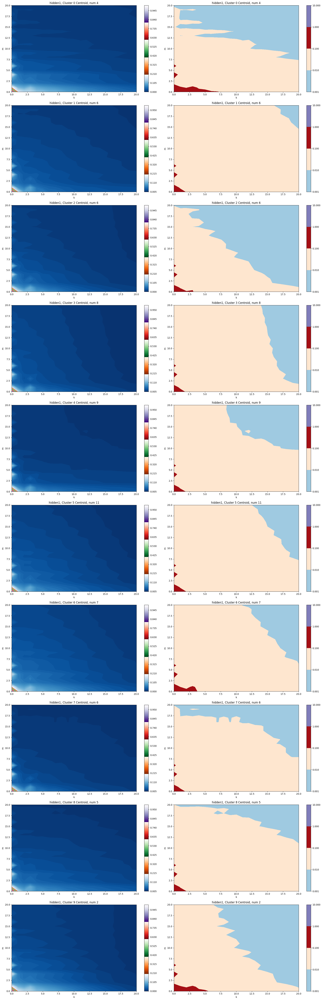

In [7]:
# cluster filters using k-means
from sklearn.cluster import KMeans
import matplotlib.ticker as ticker
import matplotlib.colors as colors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

kmax = 21

# Create the individual colormaps
cmap1 = plt.cm.Blues_r
cmap2 = plt.cm.Oranges_r
cmap3 = plt.cm.Greens_r
cmap4 = plt.cm.Reds_r
cmap5 = plt.cm.Purples_r

# Define the colors for the merged colormap
colors_merged = np.vstack([cmap1(np.linspace(0, 1, 256)),
                           cmap2(np.linspace(0, 1, 256)),
                           cmap3(np.linspace(0, 1, 256)),
                           cmap4(np.linspace(0, 1, 256)),
                           cmap5(np.linspace(0, 1, 256))])

# Create the merged colormap
cmap_merged = ListedColormap(colors_merged)
k_cluster = [5,5,5,5,5,2]  # the best k_cluster found in the elbow method
k_cluster = [10,] 
# Define the number of levels for the colormap
num_levels = 20

layer_name = ['input_map','input_layer','hidden1','hidden2','hidden3','hidden4','hidden5']
epsilon = 1e-8

for il, layer in enumerate(layer_name[2:3]):
    tmp = np.asarray(mkfields[layer])
    tmp1 = np.mean(tmp, axis=(0,1)).squeeze()
    feature_matrix = tmp1.reshape((tmp1.shape[0],21*91))  # [filters, latitude*longitude]

    feature_matrix_norm = np.zeros(feature_matrix.shape)

    # normalize the feature matrix
    for i in range(feature_matrix.shape[0]):
        M_feature = np.min(feature_matrix[i,:])
        std_feature = np.max(feature_matrix[i,:]) - np.min(feature_matrix[i,:])
        feature_matrix_norm[i,:] = (feature_matrix[i,:] - M_feature) / std_feature
    # for i in range(feature_matrix.shape[0]):
    #     M_feature = np.mean(feature_matrix[i,:])
    #     std_feature = np.std(feature_matrix[i,:])
    #     feature_matrix_norm[i,:] = (feature_matrix[i,:] - M_feature) / std_feature

    # create kmeans algorithm
    kmeans = KMeans(n_clusters=k_cluster[il], n_init=30).fit(feature_matrix_norm)
    # get the cluster labels for each sample
    labels = kmeans.labels_
    # get the cluster centroids
    centroids = kmeans.cluster_centers_
    
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors
    epsilon = 1e-8
    x = np.bincount(labels)
    # Define the number of levels for the colormap
    num_levels = 20

    # Define the logarithmic base
    log_base = 5

    # Visualize the cluster centroids
    plt.figure(figsize=(20, 6*k_cluster[il]))

    for i in range(k_cluster[il]):
        # Calculate the logarithm of the centroid values using ln (natural logarithm)
        centroid_ln = centroids[i].reshape((21, 91)) + epsilon
        
        plt.subplot(k_cluster[il], 2, 2*i+1)
        im = plt.contourf(np.arange(kmax), np.arange(21), centroid_ln[:,:kmax], levels=200,cmap=cmap_merged)
        plt.title(layer + f', Cluster {i} Centroid, num {x[i]}')
        plt.xlabel('k')
        plt.ylabel('m')
        plt.colorbar(im)        
        plt.subplot(k_cluster[il], 2, 2*i+2)
        im = plt.contourf(np.arange(kmax), np.arange(21), centroid_ln[:,:kmax], levels=200, norm=colors.LogNorm(),cmap=cmap_merged)

        plt.title(layer + f', Cluster {i} Centroid, num {x[i]}')
        plt.xlabel('k')
        plt.ylabel('m')
        cbar = plt.colorbar(im)

    plt.tight_layout()
    plt.show()

In [20]:
vmin
vmax 

-0.08510437890709367

/tmp/ipykernel_2175922/2989597885.py:9: UserWarning: Log scale: values of z <= 0 have been masked
  im = plt.contourf(np.arange(91), np.arange(21), centroid_ln,


ValueError: Invalid vmin or vmax

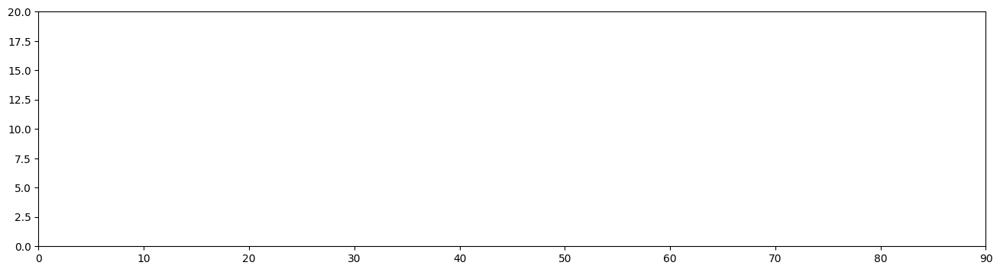

In [18]:
plt.figure(figsize=(16, 2*k_cluster[il]))

for i in range(k_cluster[il]):

    # Calculate the logarithm of the centroid values using ln (natural logarithm)
    centroid_ln = np.log(centroids[i].reshape((21, 91)) + epsilon)

    # Create a contour plot using the natural logarithm scale
    im = plt.contourf(np.arange(91), np.arange(21), centroid_ln,
                    levels=20, norm=colors.LogNorm(vmin=np.min(centroid_ln), vmax=np.max(centroid_ln)),
                    cmap='PuBu_r', shading='auto')

    # Add colorbar
    cbar = plt.colorbar(im)

    # Determine the boundaries for the colorbar intervals
    vmin, vmax = np.min(centroid_ln), np.max(centroid_ln)
    num_intervals = 10  # Number of desired colorbar intervals
    boundaries = np.linspace(vmin, vmax, num=num_intervals+1)

    # Determine the tick locations for the colorbar
    ticks = np.linspace(vmin, vmax, num=num_intervals+1)

    # Set the colorbar boundaries and ticks
    cbar.set_ticks(ticks)
    cbar.set_boundaries(boundaries)

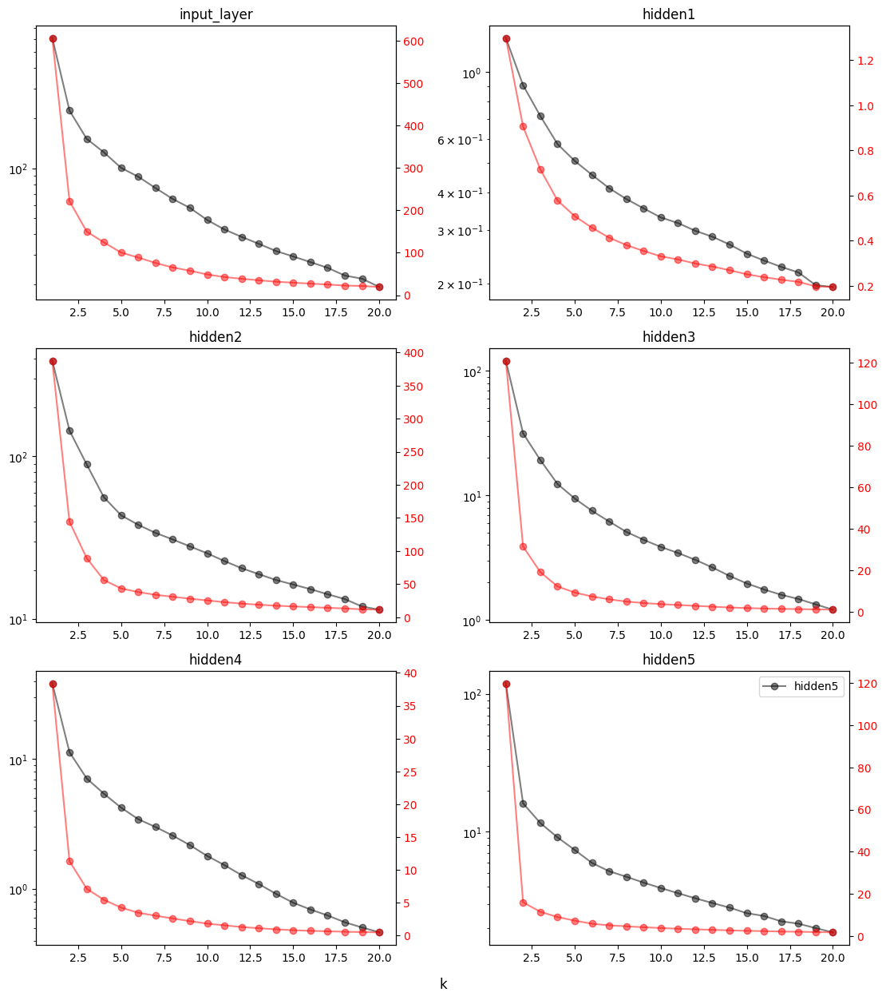

In [28]:
import matplotlib.pyplot as plt

# Assuming you have the following variables available:
# layer_name: List of layer names
# k_err: List of SSE values for each layer
# sse: List of SSE values

fig, axs = plt.subplots(3, 2, figsize=(16*0.7, 18*0.7))

for i, layer in enumerate(layer_name[1:]):
    row = i // 2
    col = i % 2

    # Plot with logarithmic scale
    axs[row, col].plot(range(1, len(k_err[i]) + 1), k_err[i], 'o-', color='black', alpha= 0.5, label=layer)
    axs[row, col].set_title(layer)
    axs[row, col].set_yscale('log')

    # Create a twin axes for linear scale
    ax2 = axs[row, col].twinx()
    ax2.plot(range(1, len(k_err[i]) + 1), k_err[i], 'o-', color='red', alpha=0.5)
    # ax2.set_ylabel('WSSE')
    ax2.tick_params(axis='y', labelcolor='red')
    ax2.set_yscale('linear')

fig.supxlabel('k')

# Place the legend on the right-y axis
axs[-1, -1].legend(loc='upper right')

plt.tight_layout()
plt.show()



In [18]:
from sklearn.datasets import make_blobs

# Set the random seed for reproducibility
np.random.seed(42)

# Generate the clusters
num_samples = 1000  # Total number of samples
num_clusters = 5  # Number of clusters
cluster_std = 1.0  # Standard deviation of each cluster

# Generate the data points
X, y = make_blobs(n_samples=num_samples, centers=num_clusters, n_features=3, cluster_std=cluster_std)

# Print the shape of the generated data
print("Data shape:", X.shape)

# Print the first 10 data points
print("First 10 data points:")
for i in range(10):
    print(X[i])

Data shape: (1000, 3)
First 10 data points:
[ 2.77976293 -6.49601324 -9.249831  ]
[-1.96571447 10.04920706  2.43177228]
[ 6.37315062 -4.81252164 -5.86733575]
[ 2.34027195 -7.40543258 -7.011148  ]
[ 5.06091653 -7.62761884 10.52555529]
[ 3.61907923 -9.44344245  8.78342418]
[-3.13889848  9.89104078  5.19161585]
[-9.57418621  7.40686999  2.90358502]
[-9.94463594  6.86933336  1.20195641]
[ 0.81760164 -6.56040385 -6.50582954]


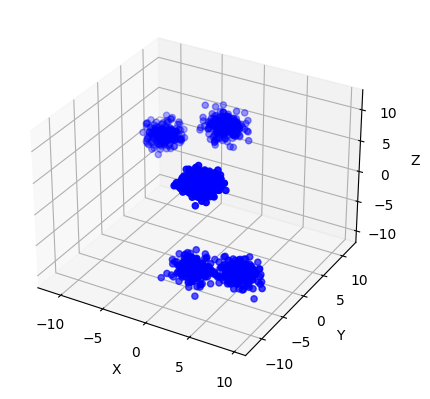

In [29]:
from mpl_toolkits.mplot3d import Axes3D

# Assuming you have the following variables available:
# X: Data points with shape (num_samples, 3)

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Extract the x, y, z coordinates from the data
x = X[:, 0]
y = X[:, 1]
z = X[:, 2]

# Plot the points in 3D
ax.scatter3D(x, y, z, c='b', marker='o')

# Set labels for the axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Show the plot
plt.show()

In [20]:
X.shape

(1000, 3)

In [30]:
# check K means with 3 random clusters.
feature_matrix_norm_test = X

kmax = 20 
sse = []
for k in range(1,kmax+1):
    # create kmeans algorithm
    kmeans = KMeans(n_clusters=k, n_init=20).fit(feature_matrix_norm_test)
    # get the cluster labels for each sample
    labels = kmeans.labels_
    # get the cluster centroids
    centroids = kmeans.cluster_centers_

    curr_sse = 0

    # calculate within-cluster-sum squared error
    for i in range(feature_matrix_norm_test.shape[0]):
        curr_center = centroids[labels[i]]
        curr_sse += np.sum((feature_matrix_norm_test[i] - curr_center) ** 2)

    sse.append(curr_sse)

k_err.append(sse)

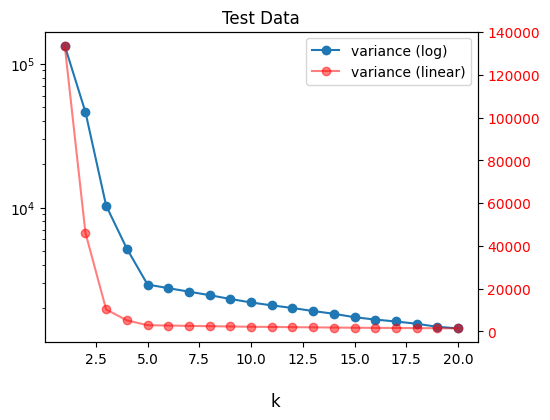

In [31]:
import matplotlib.pyplot as plt

# Assuming you have the following variables available:
# sse: Array of SSE values

fig, axs = plt.subplots(1, 1, figsize=(8*0.7, 6*0.7))

axs.plot(range(1, len(sse) + 1), sse, 'o-', label='variance (log)')
axs.set_title('Test Data')
axs.set_yscale('log')  # Set logarithmic scale on y-axis

# Create a twin axes for linear scale
ax2 = axs.twinx()
ax2.plot(range(1, len(sse) + 1), sse, 'o-', color='red', alpha=0.5, label='variance (linear)')
# ax2.set_ylabel('SSE')
ax2.tick_params(axis='y', labelcolor='red')
ax2.set_yscale('linear')

fig.supxlabel('k')

# Combine the legends from both axes
lines, labels = axs.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
axs.legend(lines + lines2, labels + labels2)

plt.tight_layout()
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


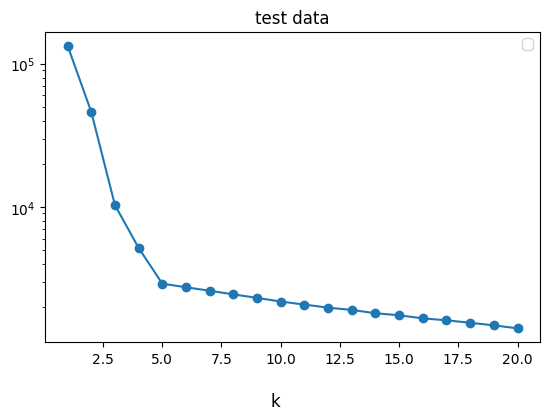

In [23]:
fig, axs = plt.subplots(1, 1, figsize=(8*0.7, 6*0.7))

axs.plot(range(1, len(sse) + 1), sse, 'o-')
axs.set_title('test data')

fig.supxlabel('k')
# axs.set_yscale('log')  # Set logarithmic scale on y-axis

axs.legend()
plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'averaged, input map, (m,k)')

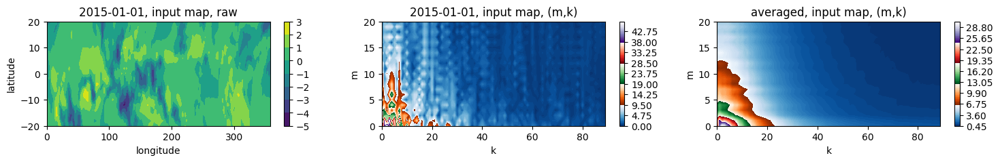

In [10]:
# visualize the first IC's activations on the input map
data_freq = np.fft.rfftfreq(180, d = 1/180)  # how many cycles along the equator
mlim = 21
klim = -1
keyname = 'input_map'
epsilon = 1e-8  # Small positive value to avoid taking the logarithm of zero
# Create the individual colormaps
cmap1 = plt.cm.Blues_r
cmap2 = plt.cm.Oranges_r
cmap3 = plt.cm.Greens_r
cmap4 = plt.cm.Reds_r
cmap5 = plt.cm.Purples_r

# Define the colors for the merged colormap
colors_merged = np.vstack([cmap1(np.linspace(0, 1, 256)),
                           cmap2(np.linspace(0, 1, 256)),
                           cmap3(np.linspace(0, 1, 256)),
                           cmap4(np.linspace(0, 1, 256)),
                           cmap5(np.linspace(0, 1, 256))])

# Create the merged colormap
cmap_merged = ListedColormap(colors_merged)

fig, axs = plt.subplots(1, 3, figsize=(18, 2))

# panel 1: ic0, raw
outputs_input_layer0 = outfields[keyname][0][0,:,:,:].squeeze()
im = axs[0].contourf(np.arange(0,360,2), np.arange(20, -22, -2), outputs_input_layer0)
plt.colorbar(im, ax=axs[0])
axs[0].set_xlabel('longitude')
axs[0].set_ylabel('latitude')
axs[0].set_title('2015-01-01, input map, raw')

# panel 2: ic0, mk
outputs_input_layer0 = mkfields[keyname][0][0,:,:,:].squeeze() + epsilon
# im = axs[1].contourf(data_freq[:klim], np.arange(mlim), outputs_input_layer0[:mlim,:klim],norm=colors.LogNorm(), cmap=cmap_merged)
im = axs[1].contourf(data_freq[:klim], np.arange(mlim), outputs_input_layer0[:mlim,:klim], levels=200, cmap=cmap_merged)
plt.colorbar(im, ax=axs[1])
axs[1].set_xlabel('k')
axs[1].set_ylabel('m')
axs[1].set_title('2015-01-01, input map, (m,k)')

# panel 3: averaged, mk
tmp = np.asarray(mkfields[keyname]).squeeze() 
outputs_input_layer0 = np.mean(tmp, axis=(0,1)) + epsilon
# im = axs[2].contourf(data_freq[:klim], np.arange(mlim), outputs_input_layer0[:mlim,:klim],norm=colors.LogNorm(), cmap=cmap_merged)
im = axs[2].contourf(data_freq[:klim], np.arange(mlim), outputs_input_layer0[:mlim,:klim], levels=200, cmap=cmap_merged)
plt.colorbar(im, ax=axs[2])
axs[2].set_xlabel('k')
axs[2].set_ylabel('m')
axs[2].set_title('averaged, input map, (m,k)')

/tmp/ipykernel_100486/1343681170.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


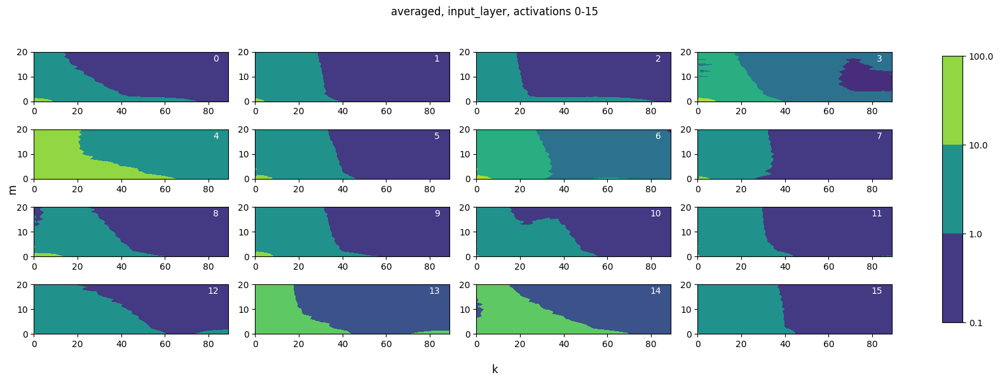

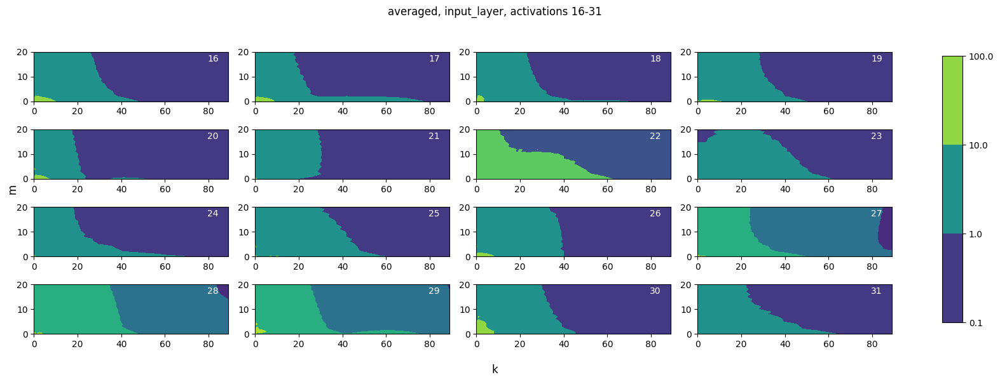

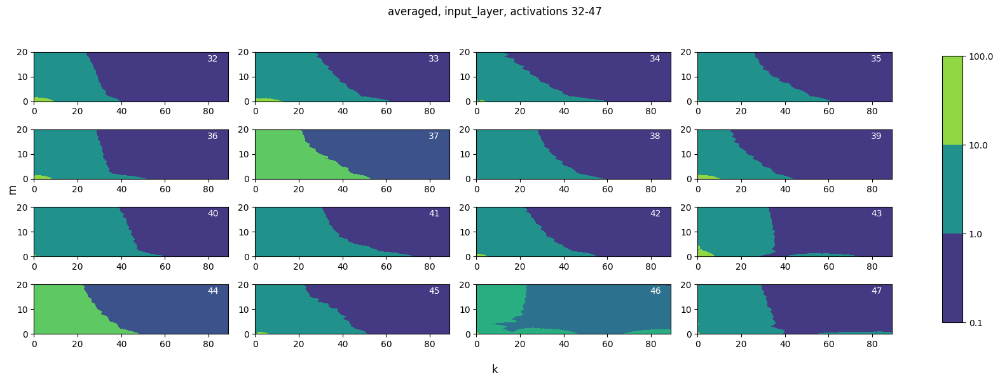

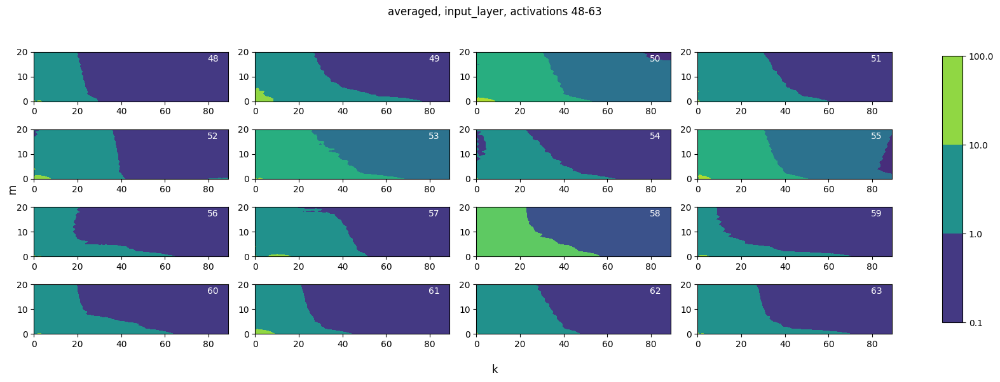

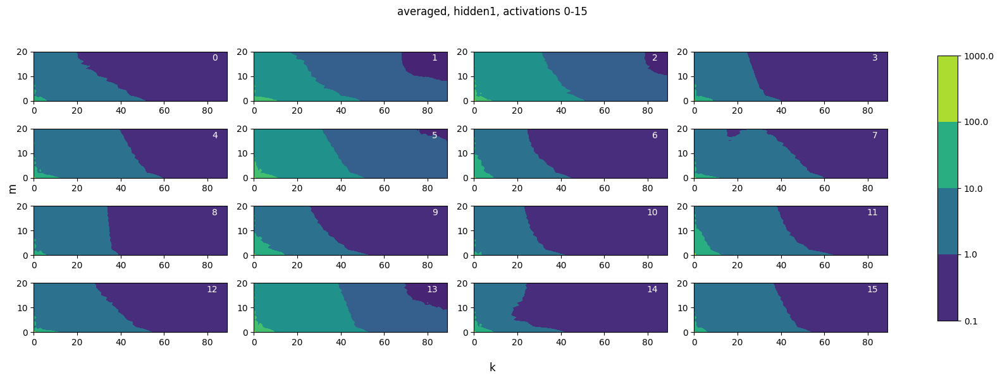

...

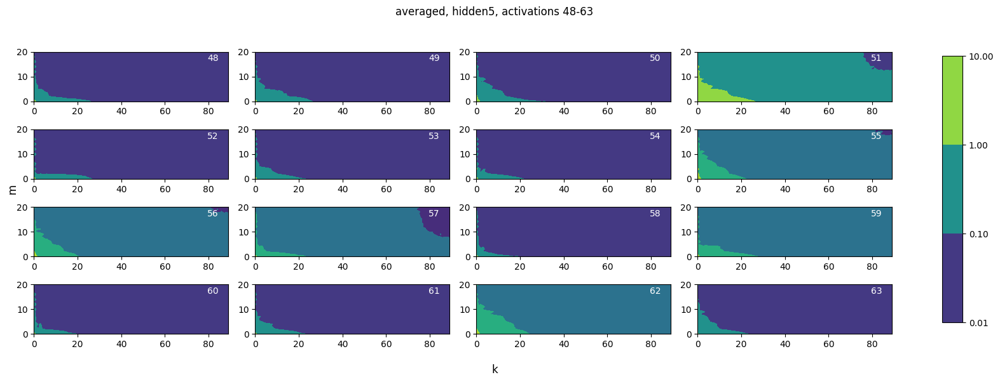

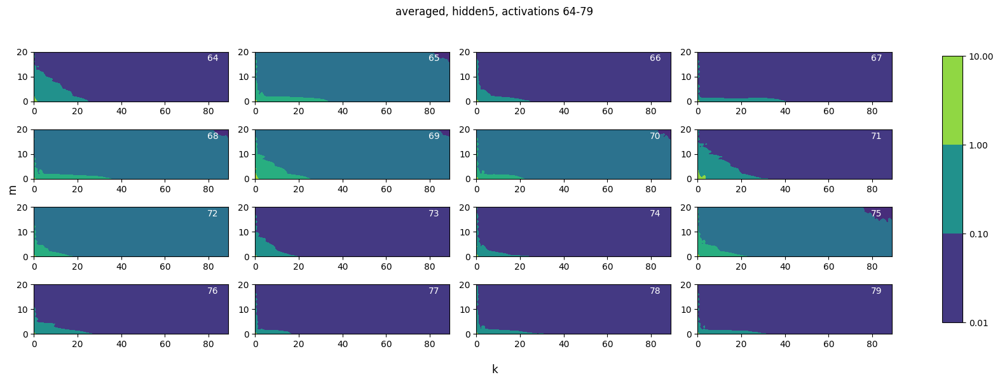

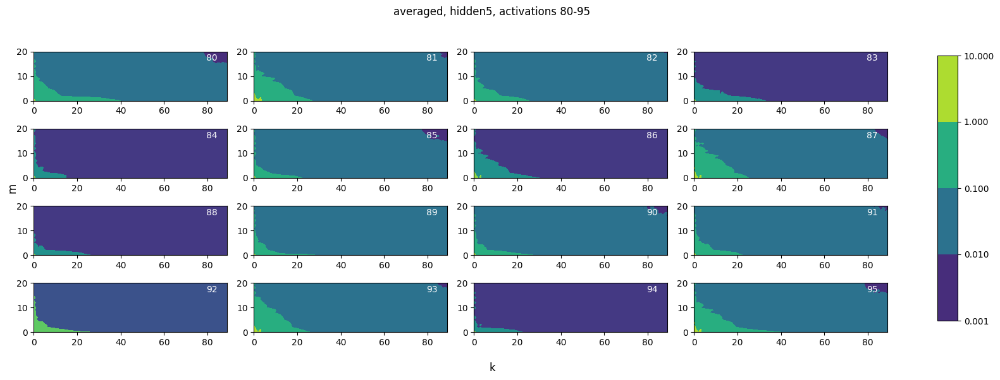

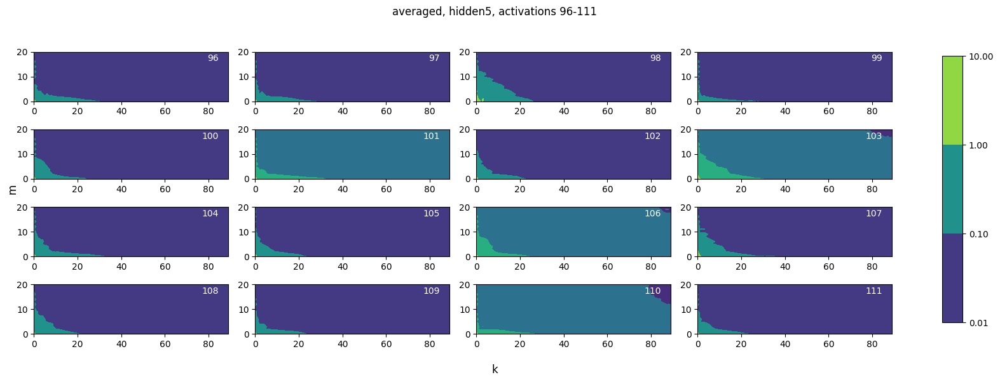

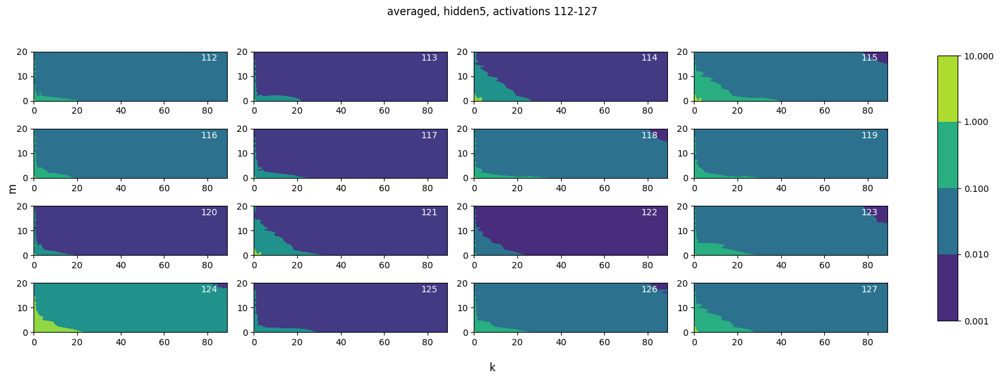

In [12]:
# visualize the first IC's activations on a selected layer
avflg = 'on'

# data_freq = np.fft.rfftfreq(180, d = 1/180)  # how many cycles along the equator

for keyname in layer_name[1:]:
    if avflg=='on':
        tmp = np.asarray(mkfields[keyname]) 
        outputs_input_layer0 = np.mean(tmp, axis=(0,1)) + epsilon
    else:    
        outputs_input_layer0 = mkfields[keyname][0][0,:,:,:].squeeze() + epsilon

    subp = outputs_input_layer0.shape[0]
    num_figures = subp // 16  # Create 4 figures with 16 subplots each

    for fig_index in range(num_figures):
        fig, axs = plt.subplots(4, 4, figsize=(16, 6))
        if avflg=='on':
            fig.suptitle(f'averaged, ' + keyname + f', activations {fig_index * 16}-{fig_index * 16 + 15}')
        else:
            fig.suptitle(f'2015-01-01, ' + keyname + f', activations {fig_index * 16}-{fig_index * 16 + 15}')
            
        # Set shared x and y labels for all subplots
        fig.supxlabel('k')
        fig.supylabel('m')
        
        for i, ax in enumerate(axs.flat):
            subplot_index = fig_index * 16 + i

            # Assuming outputs_input_layer0 is a list of tensors containing the data for each subplot
            im = ax.contourf(data_freq[:klim], np.arange(mlim), outputs_input_layer0[subplot_index].squeeze()[:mlim,:klim], norm=colors.LogNorm())

            # Mark the subplot with its index
            ax.text(0.95, 0.95, f'{subplot_index}', transform=ax.transAxes, ha='right', va='top', color='white')

        # Create a separate axis for the colorbar with adjusted width
        cax = fig.add_axes([0.94, 0.15, 0.02, 0.7])  # Adjust the position and width as needed

        fig.colorbar(im, cax=cax, orientation='vertical')

        plt.tight_layout(rect=[0, 0, 0.9, 0.95])
        plt.show()

/tmp/ipykernel_145464/751043961.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


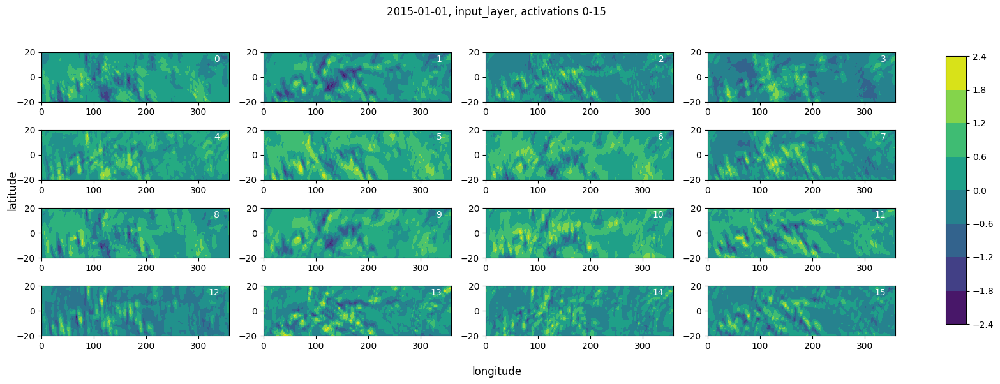

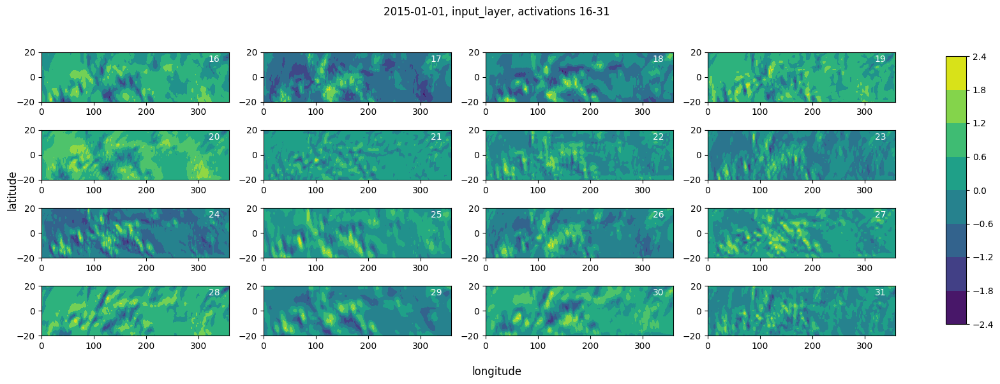

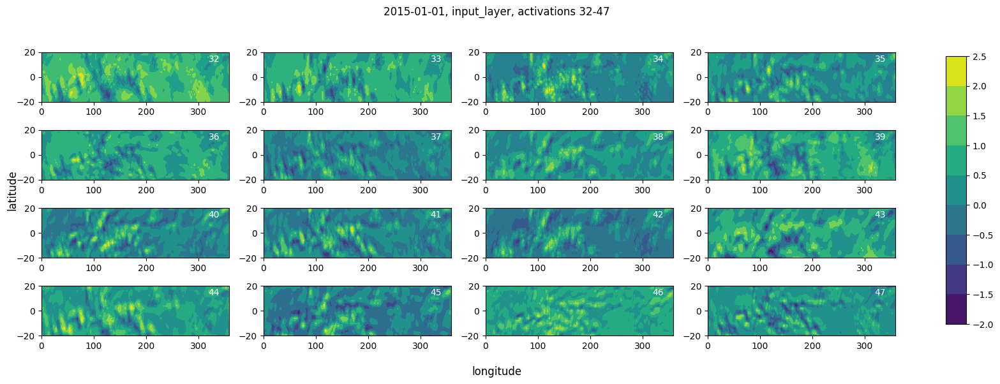

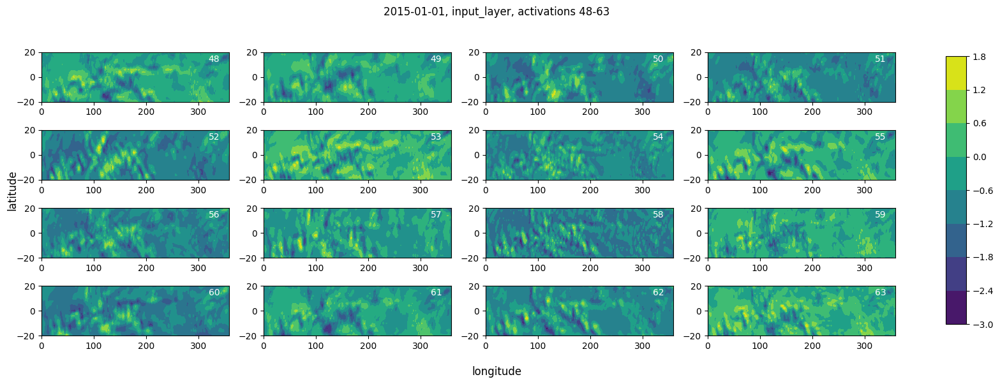

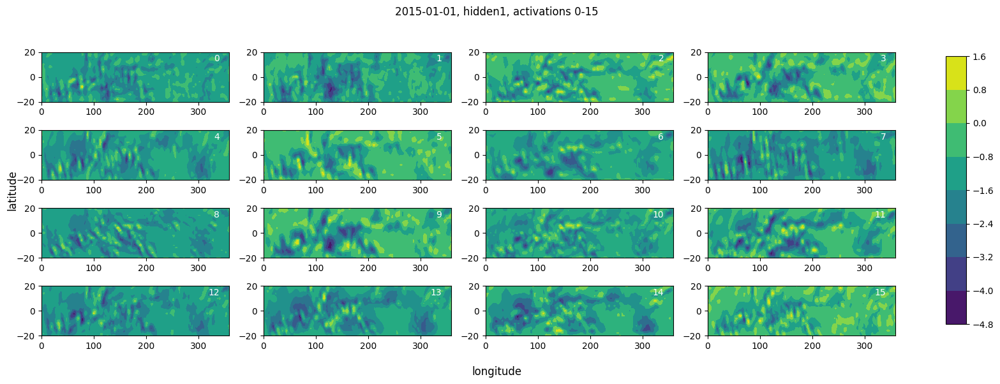

...

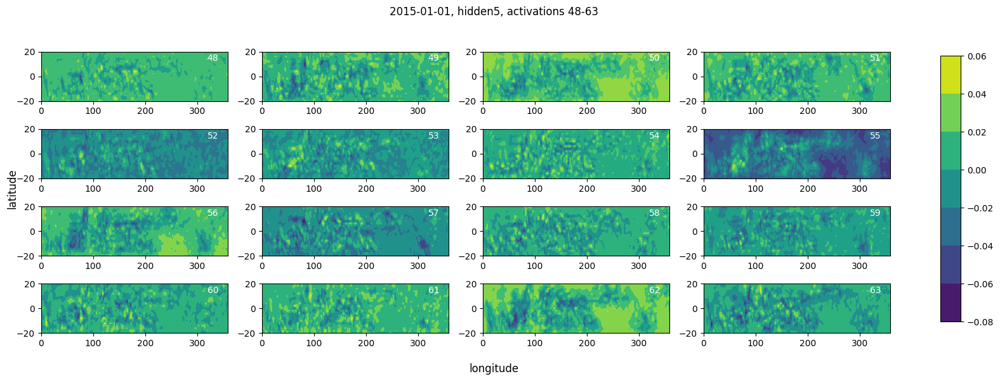

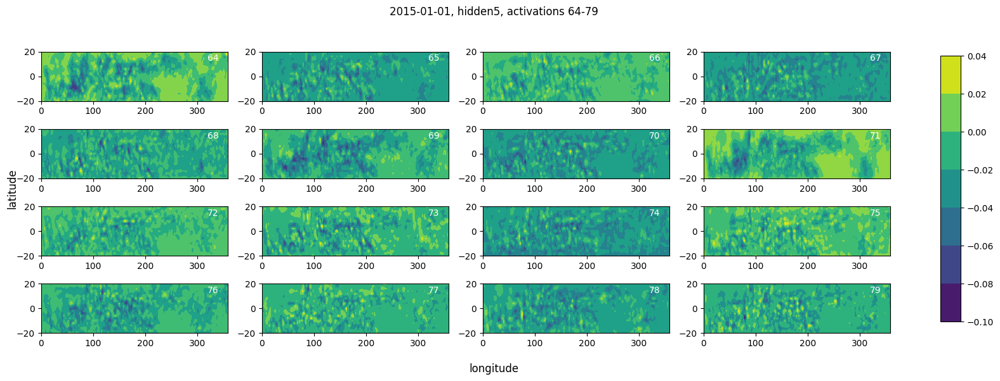

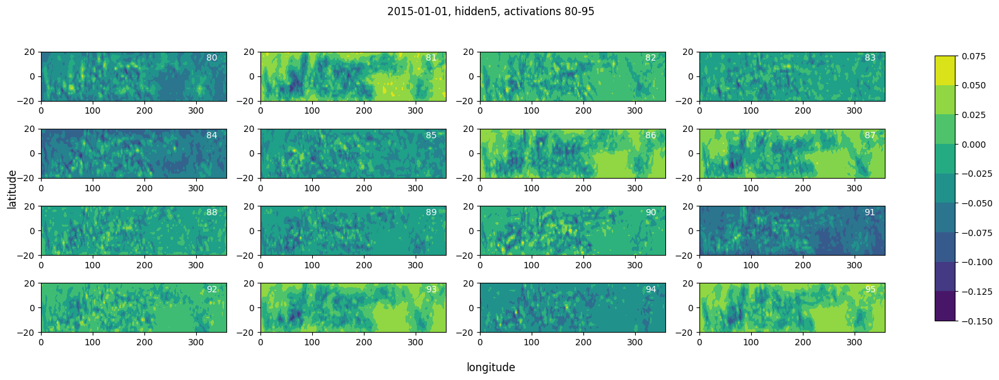

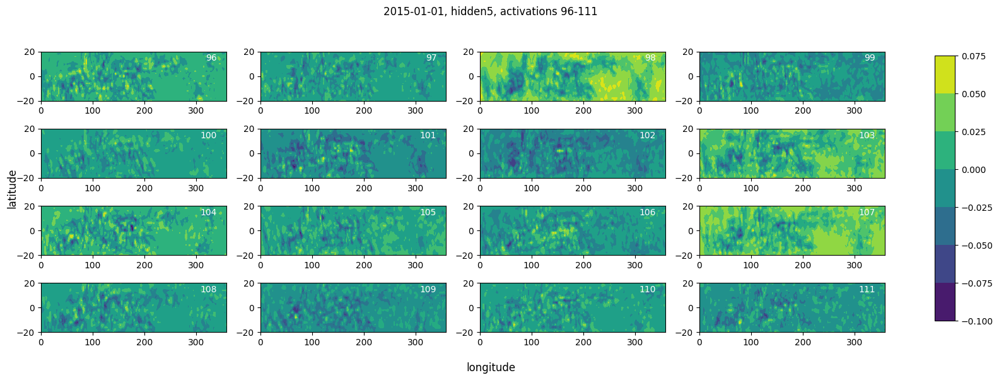

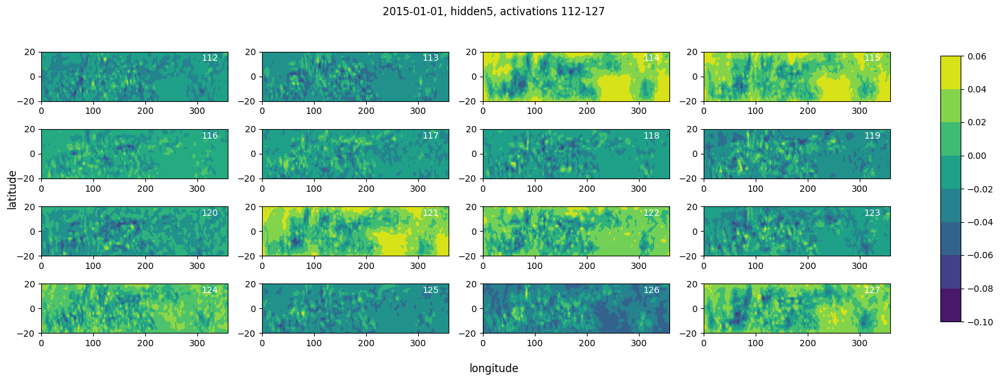

In [13]:
# visualize the activations on a selected layer
avflg = 'off'

for keyname in layer_name[1:]:
    if avflg=='on':
        tmp = np.asarray(outfields[keyname]) 
        outputs_input_layer0 = np.mean(tmp, axis=(0,1))
    else:    
        outputs_input_layer0 = outfields[keyname][0][0,:,:,:].squeeze()

    subp = outputs_input_layer0.shape[0]
    num_figures = subp // 16  # Create 4 figures with 16 subplots each

    for fig_index in range(num_figures):
        fig, axs = plt.subplots(4, 4, figsize=(16, 6))
        if avflg=='on':
            fig.suptitle(f'averaged, ' + keyname + f', activations {fig_index * 16}-{fig_index * 16 + 15}')
        else:
            fig.suptitle(f'2015-01-01, ' + keyname + f', activations {fig_index * 16}-{fig_index * 16 + 15}')
            
        # Set shared x and y labels for all subplots
        fig.supxlabel('longitude')
        fig.supylabel('latitude')
        
        for i, ax in enumerate(axs.flat):
            subplot_index = fig_index * 16 + i

            # Assuming outputs_input_layer0 is a list of tensors containing the data for each subplot
            im = ax.contourf(np.arange(0,360,2), np.arange(20,-22,-2), outputs_input_layer0[subplot_index].squeeze())

            # Mark the subplot with its index
            ax.text(0.95, 0.95, f'{subplot_index}', transform=ax.transAxes, ha='right', va='top', color='white')

        # Create a separate axis for the colorbar with adjusted width
        cax = fig.add_axes([0.94, 0.15, 0.02, 0.7])  # Adjust the position and width as needed

        fig.colorbar(im, cax=cax, orientation='vertical')

        plt.tight_layout(rect=[0, 0, 0.9, 0.95])
        plt.show()

/tmp/ipykernel_100486/3567067109.py:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


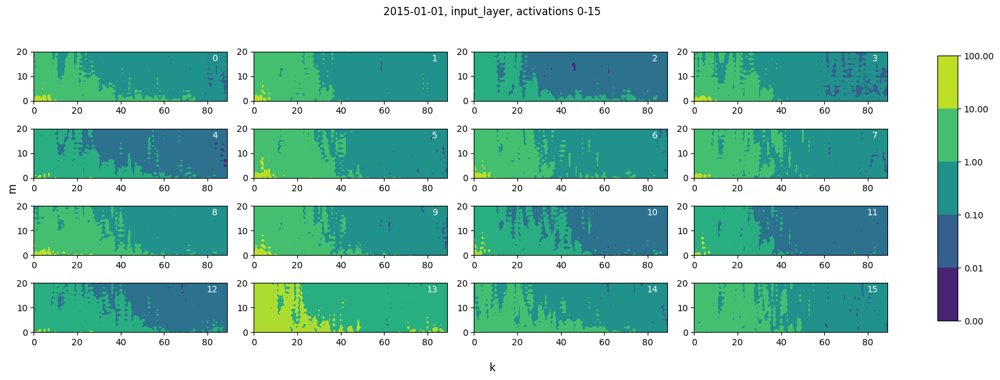

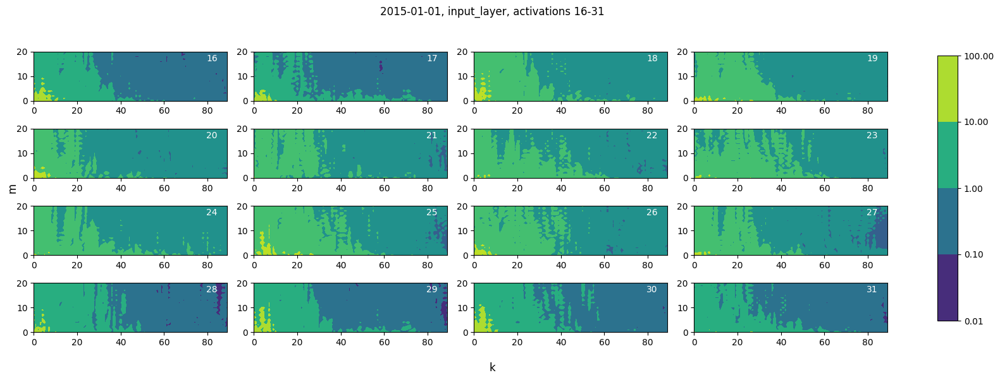

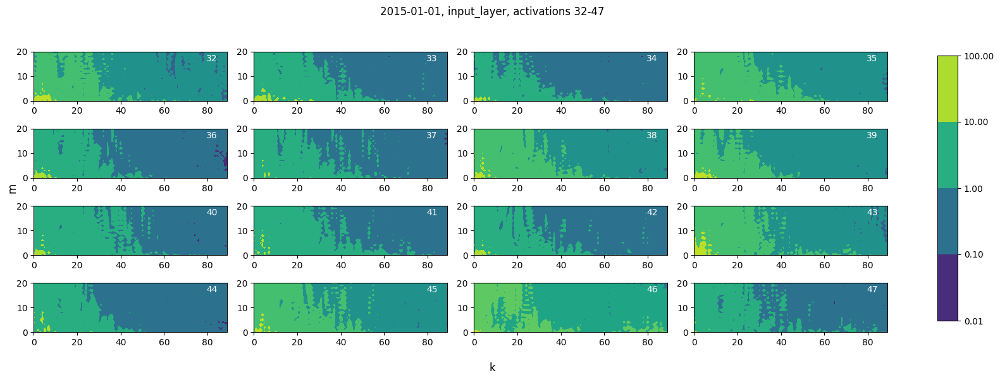

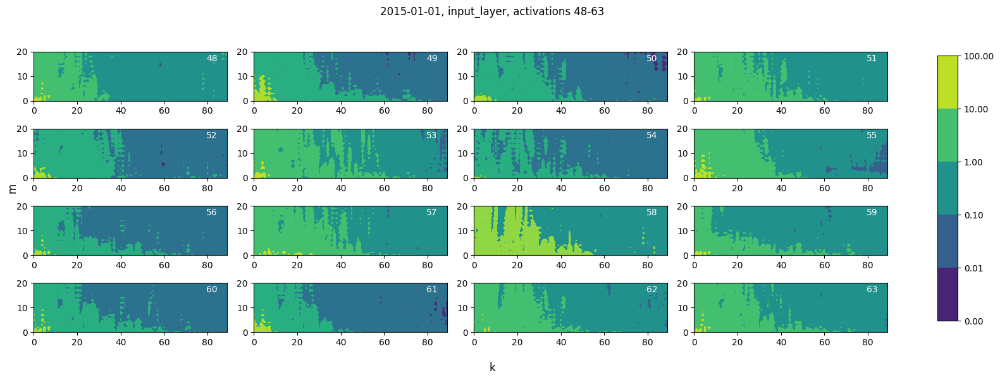

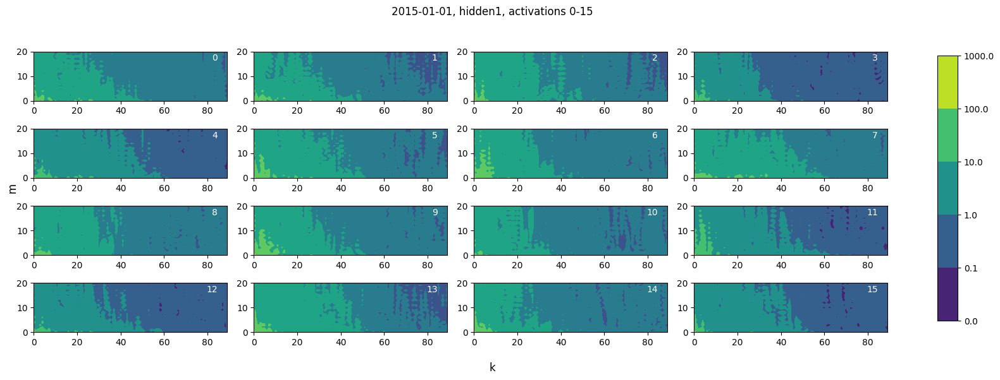

...

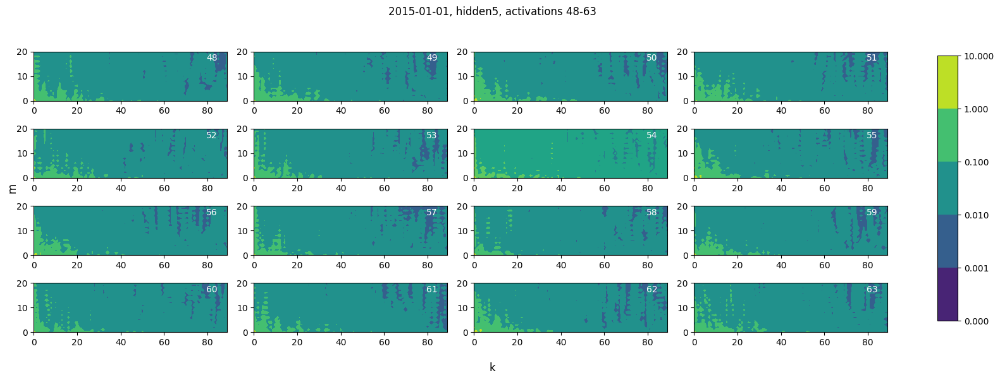

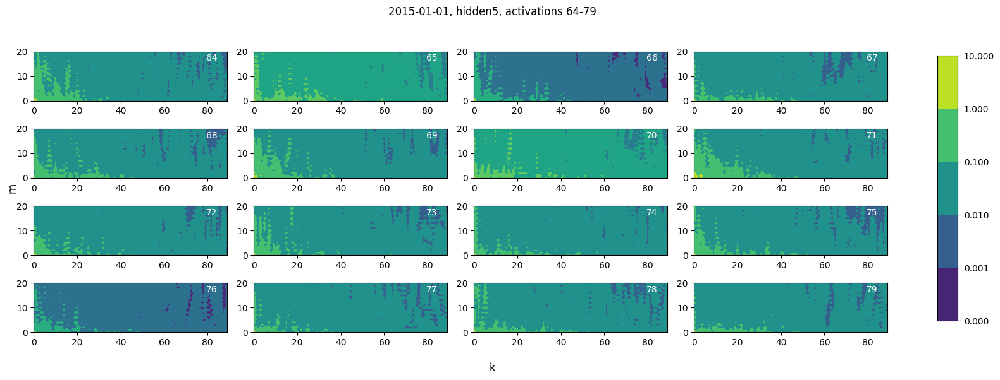

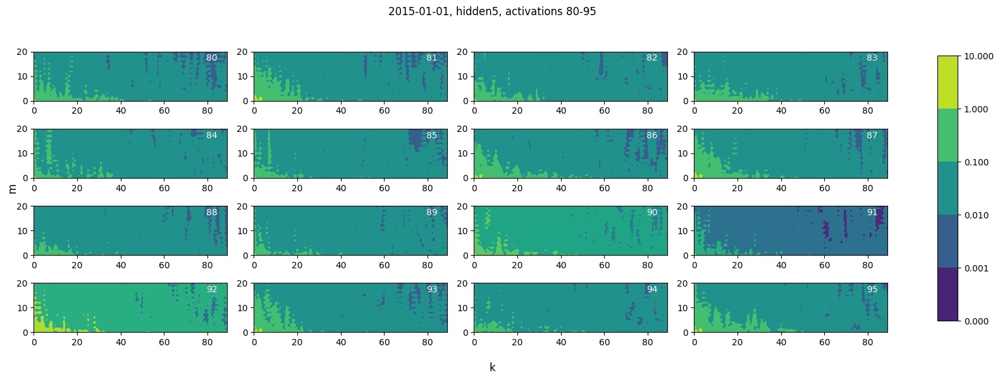

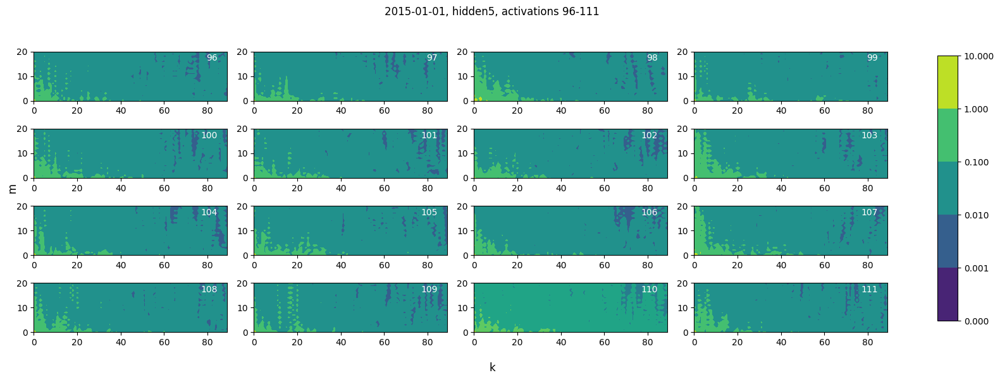

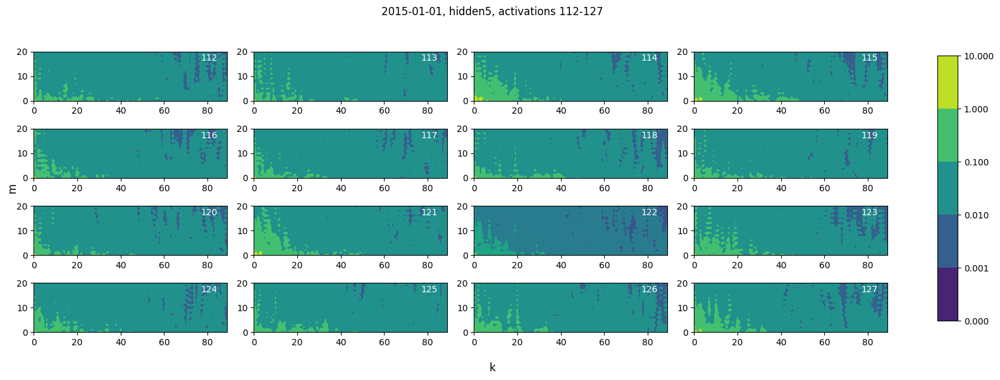

In [13]:
# visualize the first IC's activations on a selected layer
avflg = 'off'

for keyname in layer_name[1:]:
    if avflg=='on':
        tmp = np.asarray(mkfields[keyname]) 
        outputs_input_layer0 = np.mean(tmp, axis=(0,1)) + epsilon
    else:    
        outputs_input_layer0 = mkfields[keyname][0][0,:,:,:].squeeze() + epsilon

    subp = outputs_input_layer0.shape[0]
    num_figures = subp // 16  # Create 4 figures with 16 subplots each

    for fig_index in range(num_figures):
        fig, axs = plt.subplots(4, 4, figsize=(16, 6))
        if avflg=='on':
            fig.suptitle(f'averaged, ' + keyname + f', activations {fig_index * 16}-{fig_index * 16 + 15}')
        else:
            fig.suptitle(f'2015-01-01, ' + keyname + f', activations {fig_index * 16}-{fig_index * 16 + 15}')
            
        # Set shared x and y labels for all subplots
        fig.supxlabel('k')
        fig.supylabel('m')
        
        for i, ax in enumerate(axs.flat):
            subplot_index = fig_index * 16 + i

            # Assuming outputs_input_layer0 is a list of tensors containing the data for each subplot
            im = ax.contourf(data_freq[:klim], np.arange(mlim), outputs_input_layer0[subplot_index].squeeze()[:mlim,:klim], norm=colors.LogNorm())

            # Mark the subplot with its index
            ax.text(0.95, 0.95, f'{subplot_index}', transform=ax.transAxes, ha='right', va='top', color='white')

        # Create a separate axis for the colorbar with adjusted width
        cax = fig.add_axes([0.94, 0.15, 0.02, 0.7])  # Adjust the position and width as needed

        fig.colorbar(im, cax=cax, orientation='vertical')

        plt.tight_layout(rect=[0, 0, 0.9, 0.95])
        plt.show()

In [9]:
# test hook with simple NN
import torch
import torch.nn as nn

# Define your neural network model
class MyModel(nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        self.fc1 = nn.Linear(2, 2)
        self.fc2 = nn.Linear(2, 2)
        self.fc3 = nn.Linear(2, 1)
        # Initialize weights to unit and biases to zero
        self.init_weights()

    def init_weights(self):
        for module in self.modules():
            if isinstance(module, nn.Linear):
                nn.init.ones_(module.weight)
                if module.bias is not None:
                    nn.init.zeros_(module.bias)

                # # Set the data type of weights and biases
                # module.weight.data = module.weight.data.type(torch.FloatTensor)
                # module.bias.data = module.bias.data.type(torch.FloatTensor)

    def forward(self, x):
        x1 = torch.relu(self.fc1(x))
        x2 = torch.relu(self.fc2(x1))
        out = self.fc3(x2)
        return out

# Instantiate your model
model = MyModel()

# Create dictionaries to store the hidden layer outputs for each input
hidden_outputs_x1 = {}

# Define hook functions to retrieve the hidden layer outputs for each input
def hook_fn_x1(module, input, output):
    hidden_outputs_x1[module] = output

# def hook_fn_x2(module, input, output):
#     hidden_outputs_x2[module] = output

# Register hooks on desired layers for each input
model.fc1.register_forward_hook(hook_fn_x1)
model.fc2.register_forward_hook(hook_fn_x1)
# model.fc1.register_forward_hook(hook_fn_x2)
# model.fc2.register_forward_hook(hook_fn_x2)

# Pass inputs through the model
input1 = torch.ones(2)
# input1 = torch.tensor([-1,-1], dtype=torch.float32)
out= model(input1)

# Access the output of the hidden layers for each input
hidden_output_fc1_x1 = hidden_outputs_x1[model.fc1]
hidden_output_fc2_x1 = hidden_outputs_x1[model.fc2]
# hidden_output_fc1_x2 = hidden_outputs_x2[model.fc1]
# hidden_output_fc2_x2 = hidden_outputs_x2[model.fc2]

# Print the hidden layer outputs for each input
print("Hidden layer outputs for input 1:")
print(hidden_output_fc1_x1)
print(hidden_output_fc2_x1)

# print("Hidden layer outputs for input 2:")
# print(hidden_output_fc1_x2)
# print(hidden_output_fc2_x2)


Hidden layer outputs for input 1:
tensor([2., 2.], grad_fn=<AddBackward0>)
tensor([4., 4.], grad_fn=<AddBackward0>)


In [10]:
print(model.fc1)
print(model.fc2)

if model.fc1 == model.fc2:
    print('same')
else:
    print('different')

Linear(in_features=2, out_features=2, bias=True)
Linear(in_features=2, out_features=2, bias=True)
different


In [16]:
# define the model architecture
import torch
print(torch.__version__)

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
#from torchinfo import summary
import numpy as np
import sys
# import netCDF4 as nc
# from saveNCfile import savenc
# from saveNCfile_for_activations import savenc_for_activations
from data_loader_loop import load_test_data
# import hdf5storage
import xarray as xr 
import os 
from datetime import date 
from projection import projection

print('Code starts')
# April 18: project OLR onto meridional wave structures
# Updates Nov 13, 2022: Add 2dMonte
# input: 6 global maps at three time steps
# output: RMMERA5 at one time step

# parameters to be set
vn = 'olr'  # variable name

p = ''   # Monte Carlo Dropout rate = mcdp * 1%

ysta = int(1979)  # training starts
yend = int(2015)  # training ends

testystat = int(2015)  # validation starts
testyend = int(2020)  # validation ends

leadmjo = int(10) # lead for output (the MJO index)
nmem = int(1)  # the number of how many days we want to include into the input maps

zmode = int(1)  # selected verticla mode 
m = int(1)  # number of meridional modes
mflg = 'off'  # flaf of m. only use odd/even modes to reconstruct OLR. 
wnx = int(1)  # zonal wavenumber included
wnxflg = 'off'  # flag of wnx

lat_lim = int(20)  # maximum latitude in degree

mjo_ind = 'RMM'  # RMM or ROMI

nmaps = 1

datadir = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/'

if mjo_ind=='RMM':
    Fnmjo = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/rmm/full/RMM_ERA5_daily_1901to2020.nc'
elif mjo_ind=='ROMI':
    Fnmjo = '/pscratch/sd/l/linyaoly/ERA5/reanalysis/rmm/full/ROMI_ERA5_daily_1979to2021.nc'

data_save = '/pscratch/sd/l/linyaoly/ERA5/Unet4MJO/1map_MCDO_ERA5_yproj_xfft_4gpus/'
# data_save = './test_'

# path_forecasts = data_save + 'output/'
path_forecasts = './test_output/'
model_save = data_save + 'modelsave/'
pic_save = data_save + 'picsave/'

os.makedirs(path_forecasts, exist_ok=True)
os.makedirs(model_save, exist_ok=True)
os.makedirs(pic_save, exist_ok=True)

mem_list = np.arange(nmem)

batch_size = 20
num_samples = 2
lambda_reg = 0.2

# model's hyperparameters
nhidden1=500
nhidden2=200
nhidden3=50

dimx = int(1 + 2 * int(lat_lim / 2))
dimy = 180

num_filters_enc = 64
num_filters_dec1 = 128
num_filters_dec2 = 192

featureDim=num_filters_dec2*dimx*dimy

# Generate MCDO masks
mcdo_masks_conv1 = 1
mcdo_masks_conv2 = 1
mcdo_masks_conv3 = 1
mcdo_masks_conv4 = 1
mcdo_masks_conv5 = 1
mcdo_masks_conv6 = 1
mcdo_masks_outline1 = 1
mcdo_masks_outline2 = 1
mcdo_masks_outline3 = 1

class CNN(nn.Module):
    def __init__(self,imgChannels=nmaps*nmem, out_channels=2):
        super().__init__()
        self.input_layer = (nn.Conv2d(imgChannels, num_filters_enc, kernel_size=5, stride=1, padding='same'))
        self.hidden1 = (nn.Conv2d(num_filters_enc, num_filters_enc, kernel_size=5, stride=1, padding='same' ))
        self.hidden2 = (nn.Conv2d(num_filters_enc, num_filters_enc, kernel_size=5, stride=1, padding='same' ))
        self.hidden3 = (nn.Conv2d(num_filters_enc, num_filters_enc, kernel_size=5, stride=1, padding='same' ))
        self.hidden4 = (nn.Conv2d(num_filters_enc, num_filters_enc, kernel_size=5, stride=1, padding='same' ))


        self.hidden5 = (nn.Conv2d(num_filters_dec1, num_filters_dec1, kernel_size=5, stride=1, padding='same' ))
        self.hidden6 = (nn.Conv2d(num_filters_dec2, num_filters_dec2, kernel_size=5, stride=1, padding='same' ))

        self.FC1 = nn.Linear(featureDim,nhidden1)
        self.FC2 = nn.Linear(nhidden1,nhidden2)
        self.FC3 = nn.Linear(nhidden2,nhidden3)
        self.FC4 = nn.Linear(nhidden3,out_channels)

        self.dropoutconv1 = nn.Dropout2d(p=0.1)
        self.dropoutconv2 = nn.Dropout2d(p=0.1)
        self.dropoutconv3 = nn.Dropout2d(p=0.1)
        self.dropoutconv4 = nn.Dropout2d(p=0.1)
        self.dropoutconv5 = nn.Dropout2d(p=0.1)
        self.dropoutconv6 = nn.Dropout2d(p=0.1)
        self.dropoutline1 = nn.Dropout(p=0.2)
        self.dropoutline2 = nn.Dropout(p=0.2)
        self.dropoutline3 = nn.Dropout(p=0.2)
        

    def forward (self,x):

        x1 = F.relu (self.dropoutconv1(self.input_layer(x)) * mcdo_masks_conv1)
        x2 = F.relu (self.dropoutconv2(self.hidden1(x1)) * mcdo_masks_conv2)
        x3 = F.relu (self.dropoutconv3(self.hidden2(x2)) * mcdo_masks_conv3)
        x4 = F.relu (self.dropoutconv4(self.hidden3(x3)) * mcdo_masks_conv4)

        x5 = torch.cat ((F.relu(self.dropoutconv5(self.hidden4(x4)) * mcdo_masks_conv5),x3), dim =1)
        x6 = torch.cat ((F.relu(self.dropoutconv6(self.hidden5(x5)) * mcdo_masks_conv6),x2), dim =1)
        x6 = x6.view(-1,featureDim)
        x6 = F.relu(self.FC1(x6))
        x7 = F.relu(self.FC2(self.dropoutline1(x6) * mcdo_masks_outline1))
        x8 = F.relu(self.FC3(self.dropoutline2(x7) * mcdo_masks_outline2))

        out = (self.FC4(self.dropoutline3(x8) * mcdo_masks_outline3))

        return out

net = CNN()  

# ################# add hooks ###########################
# Create dictionaries to store the hidden layer output for one input
hidden_outputs_input_layer = {}
# list to store all hidden-layer output for each input
outputs_input_layer = []

# define the hook function
def hook_fn_input_layer(module, input, output):
     hidden_outputs_input_layer[module] = output

# Register hooks on desired layers for each input
net.hidden1.register_forward_hook(hook_fn_input_layer)

net.cuda()  # send the net to GPU
# net.cuda(device=gpuid)
# gpuid = os.environ["SLURM_LOCALID"]

print('Model starts')

psi_test_input_Tr_torch, psi_test_label_Tr_torch, psi_test_label_Tr, M  = load_test_data(vn,Fnmjo,leadmjo,mem_list,testystat,testyend,zmode,m,mflg,wnx,wnxflg,lat_lim,mjo_ind,pic_save)
psi_test_input_Tr_torch_norm = np.zeros(np.shape(psi_test_input_Tr_torch))

for leveln in np.arange(0,nmem):
        M_test_level = torch.mean(torch.flatten(psi_test_input_Tr_torch[:,leveln,:,:]))
        STD_test_level = torch.std(torch.flatten(psi_test_input_Tr_torch[:,leveln,:,:]))
        psi_test_input_Tr_torch_norm[:,leveln,None,:,:] = ((psi_test_input_Tr_torch[:,leveln,None,:,:]-M_test_level)/STD_test_level)

psi_test_input_Tr_torch  = torch.from_numpy(psi_test_input_Tr_torch_norm).float()

print('shape of normalized input test',psi_test_input_Tr_torch.shape)
print('shape of normalized label test',psi_test_label_Tr_torch.shape)
###############################################################################

net.load_state_dict(torch.load(model_save+'predicted_MCDO_UNET_'+vn+str(lat_lim)+'deg_'+mjo_ind+'_ERA5_lead'+str(leadmjo)+'_dailyinput_m'+str(m)+mflg+'_wnx'+str(wnx)+wnxflg+'_zmode'+str(zmode)+'_nmem'+str(nmem)+'.pt'))
net.eval()

batch_size = 20
testing_data_loader = torch.utils.data.DataLoader(psi_test_input_Tr_torch, batch_size=batch_size, drop_last=True)

# i = 0
# Disable MCDO during testing
for batch in testing_data_loader:
        batch = batch.cuda()
        tmp = net(batch)

        outputs_input_layer.append(hidden_outputs_input_layer[net.hidden1].data.cpu().numpy())
        # i = i + 1
        # if i > 1:
        #     break



2.0.0+cu117
Code starts
Model starts
combined input shape is: (1, 21, 180)
shape of normalized input test torch.Size([1826, 1, 21, 180])
shape of normalized label test torch.Size([1826, 2])


In [4]:
len(outputs_input_layer)

91

In [5]:
outputs_input_layer[0].shape

(20, 64, 21, 180)

In [17]:
outputs_input_layer0 = outputs_input_layer[0][0,:,:,:].squeeze()

In [7]:
psi_test_input_Tr_torch[0,:,:,:].numpy().squeeze().shape

(21, 180)

Text(0.5, 1.0, '2015-01-01, Input map')

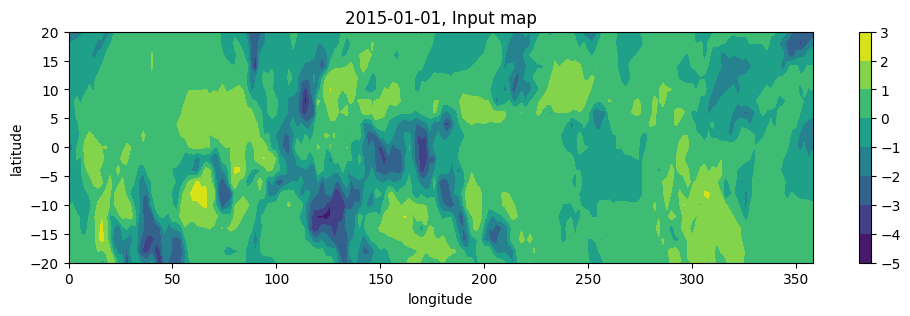

In [18]:
fig, ax = plt.subplots(1,1)
fig.set_figheight(3)
fig.set_figwidth(12)

input_map = psi_test_input_Tr_torch[0,:,:,:].numpy().squeeze()
# fig1: reconstructed OLR after zonal fft
im = ax.contourf(np.arange(0,360,2), np.arange(20,-22,-2), input_map)
ax.set_xlabel('longitude')
ax.set_ylabel('latitude')
plt.colorbar(im, ax=ax)
ax.set_title('2015-01-01, Input map')

/tmp/ipykernel_145464/2266574234.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


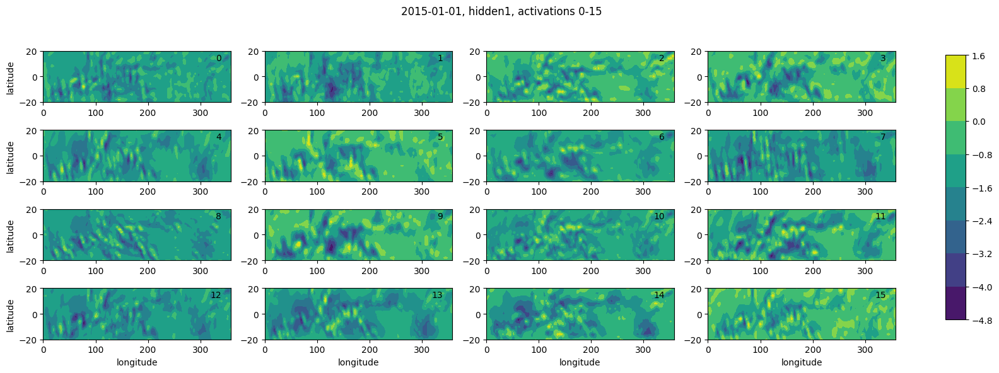

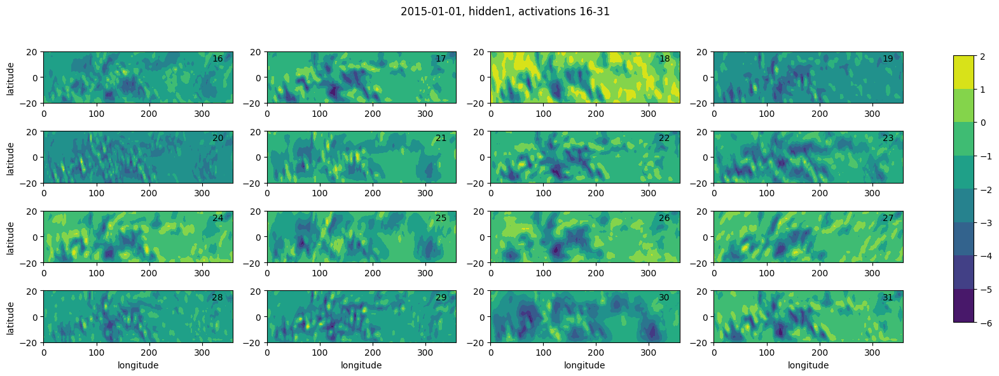

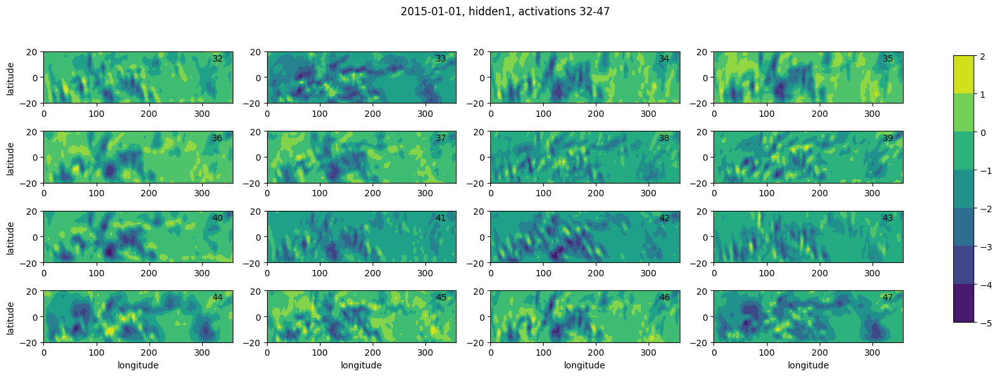

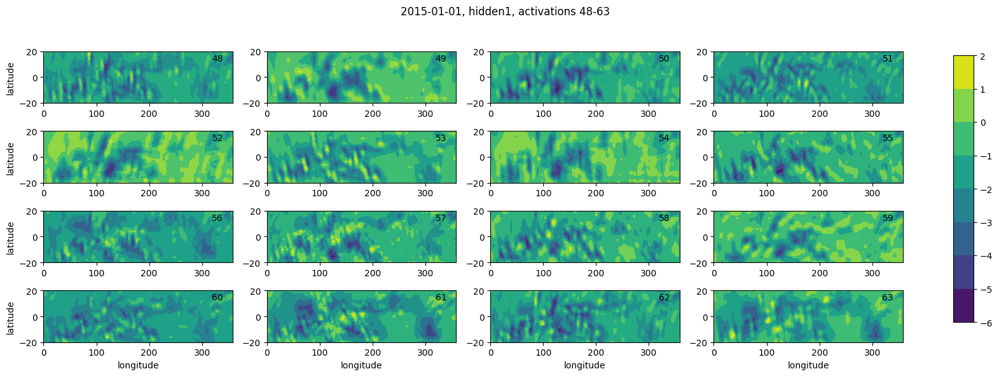

In [19]:
subp = 64
num_figures = subp // 16  # Create 4 figures with 16 subplots each

for fig_index in range(num_figures):
    fig, axs = plt.subplots(4, 4, figsize=(16, 6))
    fig.suptitle(f'2015-01-01, hidden1, activations {fig_index * 16}-{fig_index * 16 + 15}')

    for i, ax in enumerate(axs.flat):
        subplot_index = fig_index * 16 + i

        # Assuming outputs_input_layer0 is a list of tensors containing the data for each subplot
        im = ax.contourf(np.arange(0, 360, 2), np.arange(20, -22, -2), outputs_input_layer0[subplot_index].squeeze())

        # Set shared x and y labels for all subplots
        if i % 4 == 0:
            ax.set_ylabel('latitude')
        if i >= 12:
            ax.set_xlabel('longitude')

        # Mark the subplot with its index
        ax.text(0.95, 0.95, f'{subplot_index}', transform=ax.transAxes, ha='right', va='top')

    # Create a separate axis for the colorbar with adjusted width
    cax = fig.add_axes([0.94, 0.15, 0.02, 0.7])  # Adjust the position and width as needed

    fig.colorbar(im, cax=cax, orientation='vertical')

    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    plt.show()

In [23]:
def get_um(u, latlim):
    # u has a shape of [batch_size, filters, lat, longitude]
    # do meridional projection on each longitude for each activations
    lat = np.arange(latlim,-latlim-2,-2)

    # parameters
    zmode = 1
    N = 1e-2  # buoyancy frequency (s-1)
    H = 1.6e4  # tropopause height (m)
    beta= 2.28e-11  # variation of coriolis parameter with latitude
    c = N * H / np.pi / zmode # gravity wave speed
    L = np.sqrt(c / beta)  # horizontal scale (m)

    # define y = lat * 110 km / L
    y = lat * 110 * 1000 / L # dimensionless

    # define meridianol wave structures
    phi = []

    for i in np.arange(len(lat)):
        p = special.hermite(i)
        Hm = p(y)
        phim = np.exp(- y**2 / 2) * Hm / np.sqrt((2**i) * np.sqrt(np.pi) * math.factorial(i))

        phi.append(np.reshape(phim, (1, 1, len(y), 1)))

    # projection coefficients
    um = np.zeros((u.shape[0], u.shape[1], len(lat), u.shape[-1]))

    dy = (lat[0] - lat[1]) * 110 * 1000 / L 

    for i in range(len(lat)):
        um0 = np.sum(u * phi[i] * dy, axis=2, keepdims=True)  # (1, 1, 1, lon)
        um[:,:,i,None,:] = um0

    return um

In [70]:
latlim = 60
u = np.ones((1,1,int(latlim+1),180))
x = np.arange(0,1,1/180)
ux = np.sin(2*np.pi*x) + np.sin(4*np.pi*x) + np.sin(6*np.pi*x)

u = u * np.reshape(ux, (1,1,1,180))

p = special.hermite(0)
lat = np.arange(latlim,-latlim-2,-2)
# parameters
zmode = 1
N = 1e-2  # buoyancy frequency (s-1)
H = 1.6e4  # tropopause height (m)
beta= 2.28e-11  # variation of coriolis parameter with latitude
g = 9.8  # gravity acceleration 
theta0 = 300  # surface potential temperature (K)
c = N * H / np.pi / zmode # gravity wave speed
L = np.sqrt(c / beta)  # horizontal scale (m)
y = lat * 110 * 1000 / L # dimensionless
i = 0
u = u * np.reshape(np.exp(- y**2 / 2) * p(y) / np.sqrt((2**i) * np.sqrt(np.pi) * math.factorial(i)), (1, 1, len(y), 1))

um = get_um(u, latlim=latlim)

Text(0.5, 1.0, 'difference')

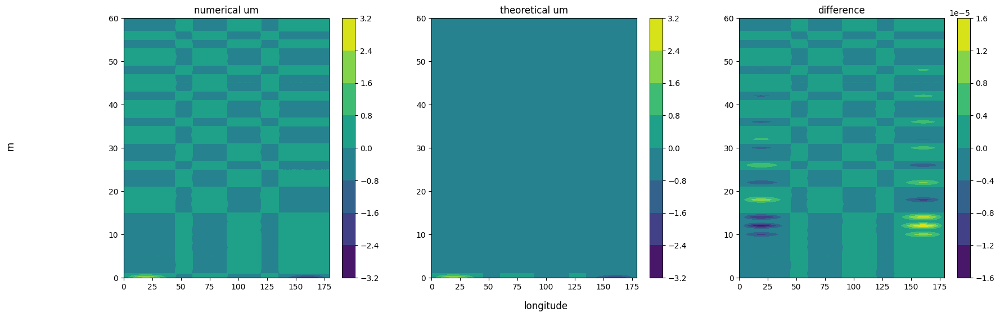

In [71]:
# check theoretical um versus calculated um
um_theory = np.zeros(um.squeeze().shape)
um_theory[0,:] = ux

fig, axs = plt.subplots(1,3, figsize=(20,6))
fig.supxlabel('longitude')
fig.supylabel('m')
im = axs[0].contourf(np.arange(um.squeeze().shape[1]), np.arange(len(y)), um.squeeze())
plt.colorbar(im, ax=axs[0])
axs[0].set_title('numerical um')

im = axs[1].contourf(np.arange(um.squeeze().shape[1]), np.arange(len(y)), um_theory)
plt.colorbar(im, ax=axs[1])
axs[1].set_title('theoretical um')

im = axs[2].contourf(np.arange(um.squeeze().shape[1]), np.arange(len(y)), um.squeeze() - um_theory)
plt.colorbar(im, ax=axs[2])
axs[2].set_title('difference')


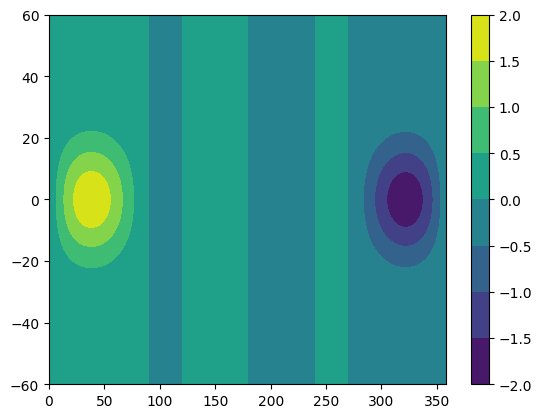

In [72]:
lon = np.arange(0,360,2)
im = plt.contourf(lon, lat, u.squeeze())
plt.colorbar(im)

In [73]:
um_fft = np.fft.rfft(um.squeeze(), axis=1)  # [latitude, longitude / 2 + 1]

data_freq = np.fft.rfftfreq(um.squeeze().shape[1], d = 1/um.squeeze().shape[1])  # how many cycles along the equator

pw_fft = np.abs(um_fft)

Text(0.5, 1.0, 'difference')

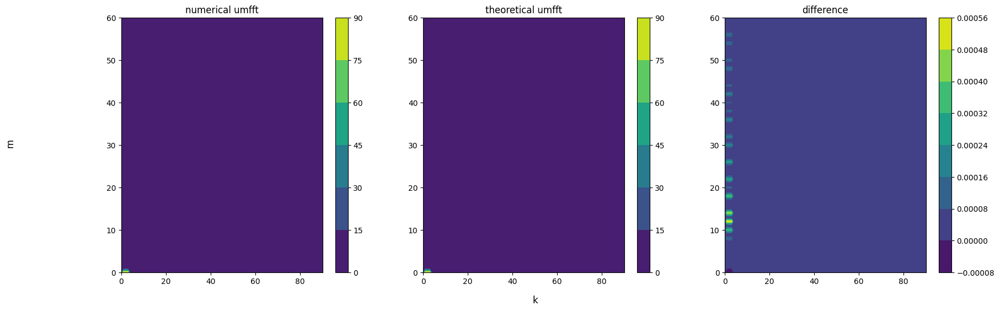

In [84]:
# check theoretical um-fft versus calculated um_fft
umfft_theory = np.zeros(um_fft.shape) + 0j
umfft_theory[0, 1:4] = - 90j
pwfft_theory = np.abs(umfft_theory)

fig, axs = plt.subplots(1,3, figsize=(20,6))
fig.supxlabel('k')
fig.supylabel('m')
im = axs[0].contourf(np.arange(pwfft_theory.squeeze().shape[1]), np.arange(len(y)), pw_fft.squeeze())
plt.colorbar(im, ax=axs[0])
axs[0].set_title('numerical umfft')

im = axs[1].contourf(np.arange(pwfft_theory.squeeze().shape[1]), np.arange(len(y)), pwfft_theory)
plt.colorbar(im, ax=axs[1])
axs[1].set_title('theoretical umfft')

im = axs[2].contourf(np.arange(pwfft_theory.squeeze().shape[1]), np.arange(len(y)), pw_fft.squeeze() - pwfft_theory)
plt.colorbar(im, ax=axs[2])
axs[2].set_title('difference')


In [29]:
# reconstruct u

um_re = np.fft.irfft(um_fft, len(lon), axis=-1)

u_re = np.zeros((len(lat), len(lon)))

u_re = u_re + um_re[0,:] * np.reshape(np.exp(- y**2 / 2) * p(y) / np.sqrt((2**i) * np.sqrt(np.pi) * math.factorial(i)), (len(y), 1))

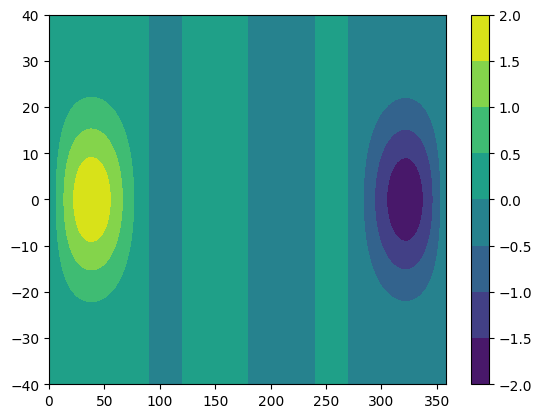

In [30]:
lon = np.arange(0,360,2)
im = plt.contourf(lon, lat, u_re.squeeze())
plt.colorbar(im)

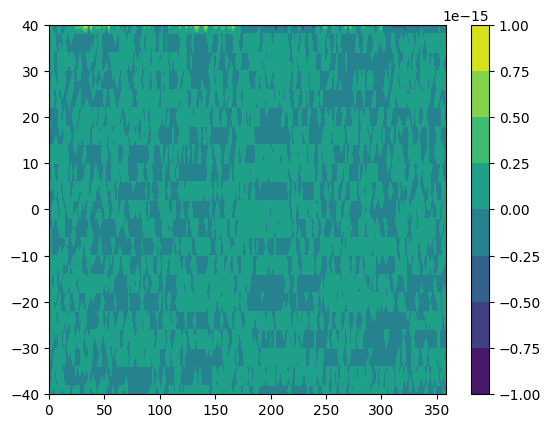

In [31]:
lon = np.arange(0,360,2)
im = plt.contourf(lon, lat, um.squeeze()-um_re.squeeze())
plt.colorbar(im)

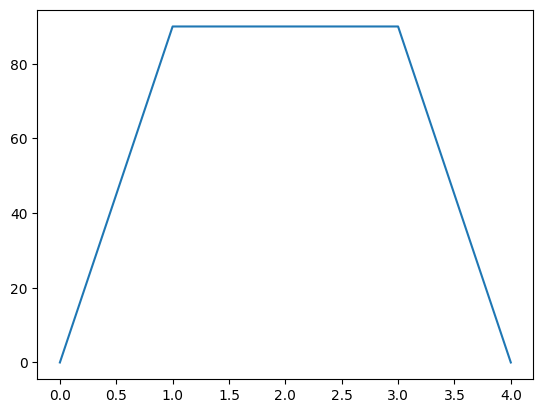

In [32]:
ux_fft = np.fft.rfft(ux)
ux_fq = np.fft.rfftfreq(len(ux),d=1/len(ux))

plt.plot(ux_fq[:5], np.abs(ux_fft[:5]))

In [ ]:
# check theoretical um-fft versus calculated um_fft
um_theory = np.zeros(um.squeeze().shape)
um_theory[0,:] = ux

fig, axs = plt.subplots(1,3, figsize=(20,6))
fig.supxlabel('longitude')
fig.supylabel('m')
im = axs[0].contourf(np.arange(um.squeeze().shape[1]), np.arange(len(y)), um.squeeze())
plt.colorbar(im, ax=axs[0])
axs[0].set_title('numerical um')

im = axs[1].contourf(np.arange(um.squeeze().shape[1]), np.arange(len(y)), um_theory)
plt.colorbar(im, ax=axs[1])
axs[1].set_title('theoretical um')

im = axs[2].contourf(np.arange(um.squeeze().shape[1]), np.arange(len(y)), um.squeeze() - um_theory)
plt.colorbar(im, ax=axs[2])
axs[2].set_title('difference')


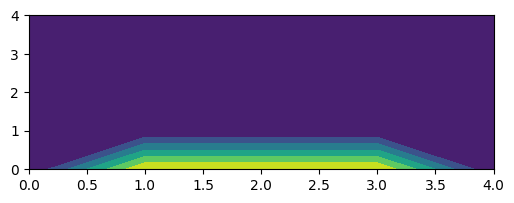

In [34]:
fig, axs = plt.subplots(1,1, figsize=(6,2))

axs.contourf(data_freq[:5], np.arange(5), pw_fft[:5,:5])

In [40]:
pw_theory = np.zeros(pw_fft.shape)
pw_theory.shape

(41, 91)

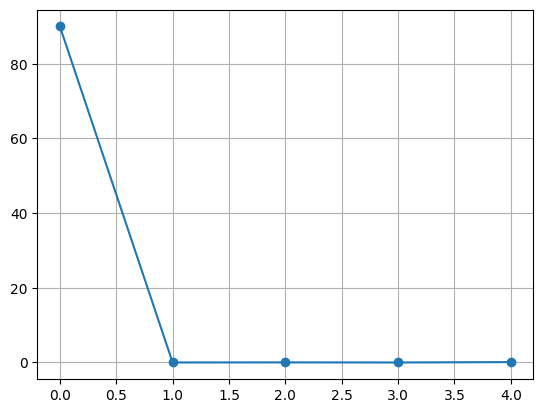

In [35]:
plt.plot(np.arange(5), pw_fft[:5,1],'o-')
plt.grid(visible=True)

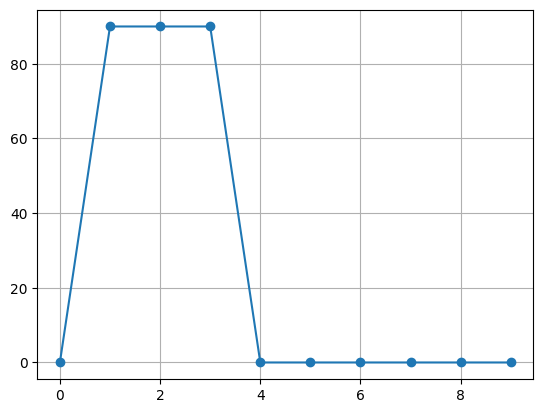

In [36]:
plt.plot(np.arange(10), pw_fft[0,:10],'o-')
plt.grid(visible=True)

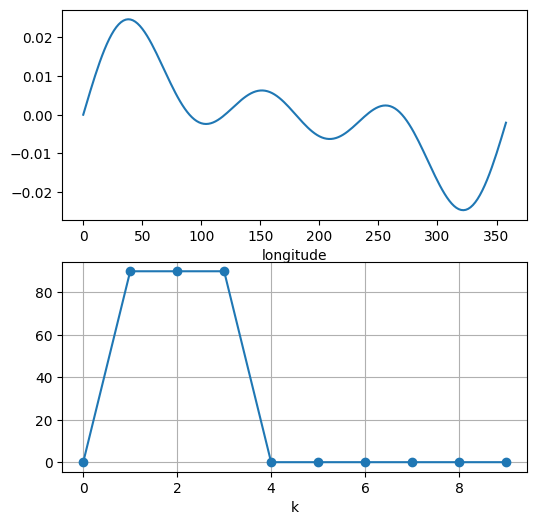

In [37]:
# visualize u and um
fig, axs = plt.subplots(2,1, figsize=(6,6))

# im = axs[0].contourf(np.arange(0,360,2), lat, u.squeeze())
# fig.colorbar(im, ax=axs[0])
axs[0].plot(np.arange(0,360,2), u[0,0,0,:].squeeze())
axs[0].set_xlabel('longitude')

axs[1].plot(np.arange(10), np.abs(um_fft[0,:10].squeeze()),'o-')
axs[1].set_xlabel('k')
plt.grid(visible=True)

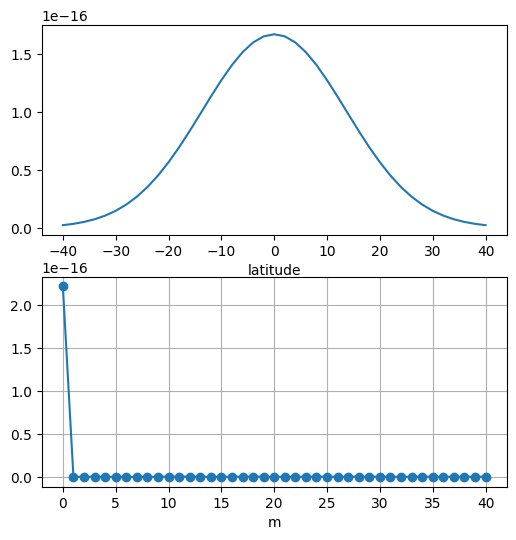

In [38]:
# visualize u and um
fig, axs = plt.subplots(2,1, figsize=(6,6))

# im = axs[0].contourf(np.arange(0,360,2), lat, u.squeeze())
# fig.colorbar(im, ax=axs[0])
axs[0].plot(lat, u[0,0,:,45].squeeze())
axs[0].set_xlabel('latitude')

axs[1].plot(np.arange(len(y)), um[0,0,:,45].squeeze(),'o-')
axs[1].set_xlabel('m')
plt.grid(visible=True)

In [21]:
# get m and m's coefficients. 
outputs_input_layer_m = []

for i in range(len(outputs_input_layer)):
    outputs_batch_m = get_um(outputs_input_layer[i])   # [batch_size, filters, lat, lon]
    outputs_input_layer_m.append(outputs_batch_m)

np.asarray(outputs_input_layer_m).shape

(91, 20, 64, 21, 180)

In [22]:
outputs_input_layer_m0 = outputs_input_layer_m[0][0,:,:,:].squeeze()  # [filters, lat, lon]

/tmp/ipykernel_145464/1967755934.py:48: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


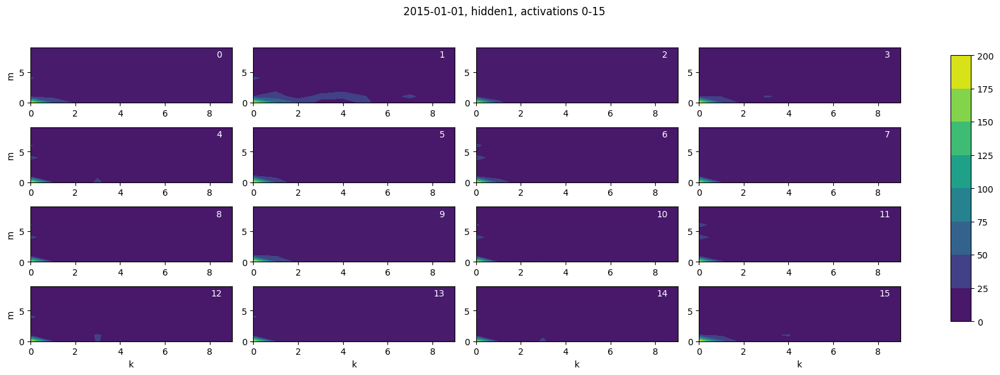

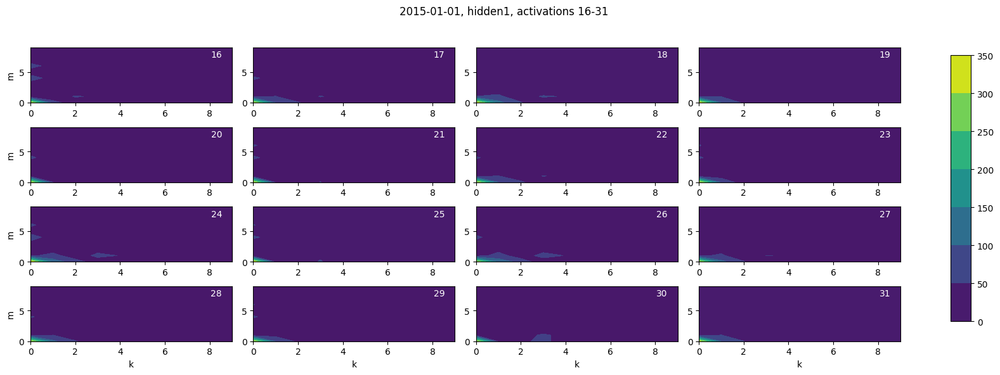

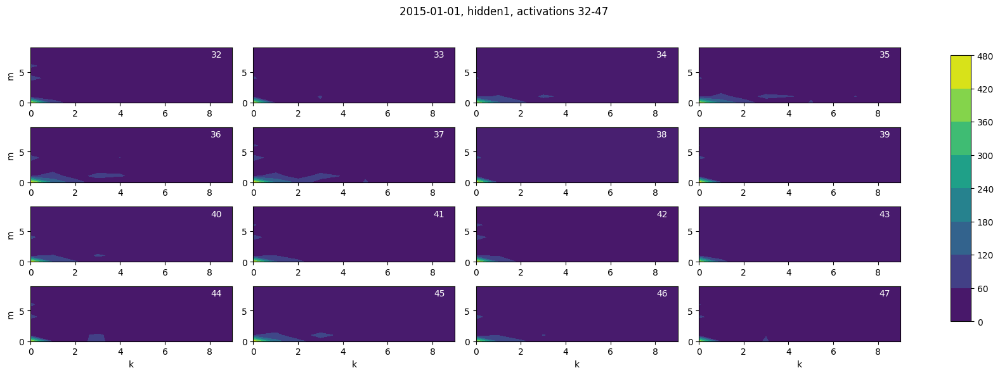

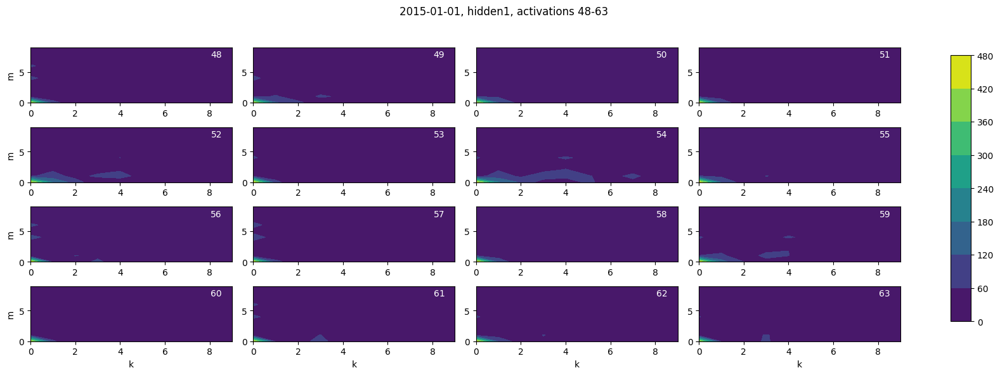

In [25]:
subp = 64
num_figures = subp // 16  # Create 4 figures with 16 subplots each
mflg = 'on'

for fig_index in range(num_figures):
    fig, axs = plt.subplots(4, 4, figsize=(16, 6))
    fig.suptitle(f'2015-01-01, hidden1, activations {fig_index * 16}-{fig_index * 16 + 15}')

    for i, ax in enumerate(axs.flat):
        subplot_index = fig_index * 16 + i

        # Assuming outputs_input_layer0 is a list of tensors containing the data for each subplot
        if mflg=='off':
            data = outputs_input_layer0[subplot_index].squeeze()  # [latitude, longitude]
        else:
            data = outputs_input_layer_m0[subplot_index].squeeze()  # [latitude, longitude]

        data_fft = np.fft.rfft(data, axis=1)  # [latitude, longitude / 2 + 1]

        data_freq = np.fft.rfftfreq(data.shape[1], d = 1/data.shape[1])  # how many cycles along the equator

        pw_fft = np.abs(data_fft)

        if mflg=='off':
            im = ax.contourf(data_freq, np.arange(20, -22, -2), pw_fft)
            # Set shared x and y labels for all subplots
            if i % 4 == 0:
                ax.set_ylabel('latitude')
            if i >= 12:
                ax.set_xlabel('k')
        else:
            im = ax.contourf(data_freq[:10], np.arange(int(len(y)/2)), pw_fft[:10,:int(len(y)/2)])

            # Set shared x and y labels for all subplots
            if i % 4 == 0:
                ax.set_ylabel('m')
            if i >= 12:
                ax.set_xlabel('k')

        # Mark the subplot with its index
        ax.text(0.95, 0.95, f'{subplot_index}', transform=ax.transAxes, ha='right', va='top', color='white')

    # Create a separate axis for the colorbar with adjusted width
    cax = fig.add_axes([0.94, 0.15, 0.02, 0.7])  # Adjust the position and width as needed

    fig.colorbar(im, cax=cax, orientation='vertical')

    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    plt.show()

In [58]:
# averaged over all initial conditions
# outputs_input_layer contains 91 lists; each list contains [20x64x21x180] elements
ics_input_layer = []  # store FFT of input layer information for all initial conditions. 
for i in range(len(outputs_input_layer)):
    if mflg=='off':
        data = outputs_input_layer[i].squeeze()  # [batch_size, filters, latitude, longitude]
    else:
        data = outputs_input_layer_m[i].squeeze()

    data_fft = np.fft.rfft(data, axis=-1)  # [batch_size, filters, latitude, longitude / 2 + 1]
    pw_fft = np.abs(data_fft)  # [batch_size, filters, latitude, longitude / 2 + 1]
    ics_input_layer.append(pw_fft)


In [59]:
input_layer_fft = np.asarray(ics_input_layer)

In [60]:
av_input_layer_fft = np.mean(input_layer_fft, axis=(0,1))

In [61]:
av_input_layer_fft.shape

(64, 21, 91)

In [62]:
mflg 

'on'

/tmp/ipykernel_207675/3556356246.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 0.95])


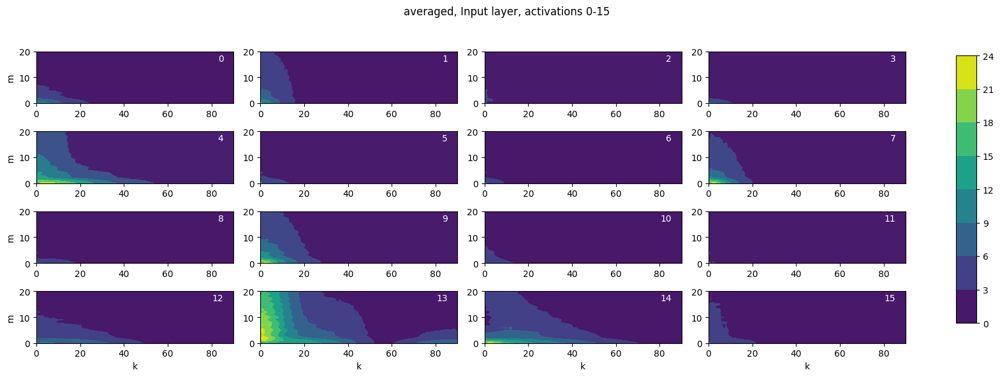

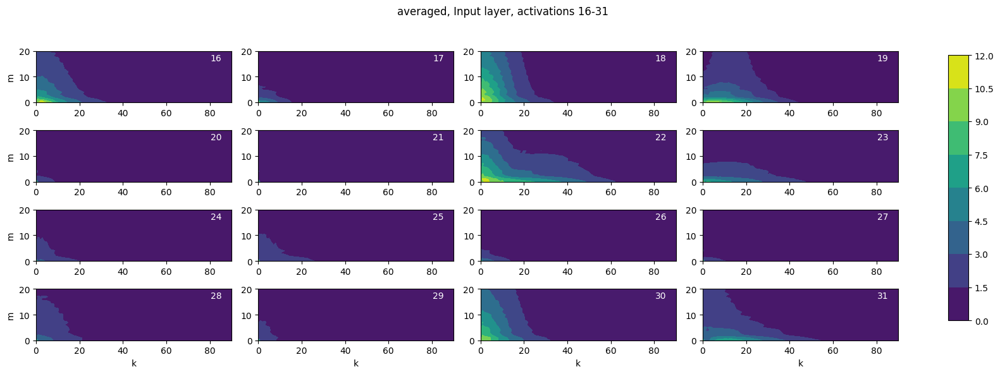

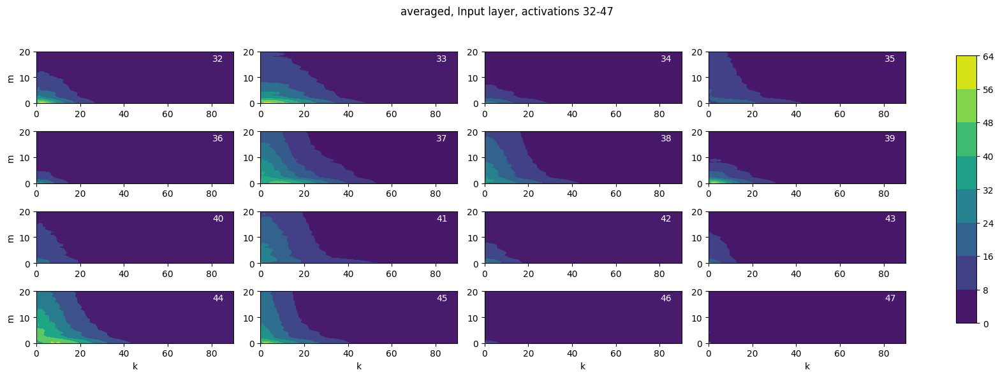

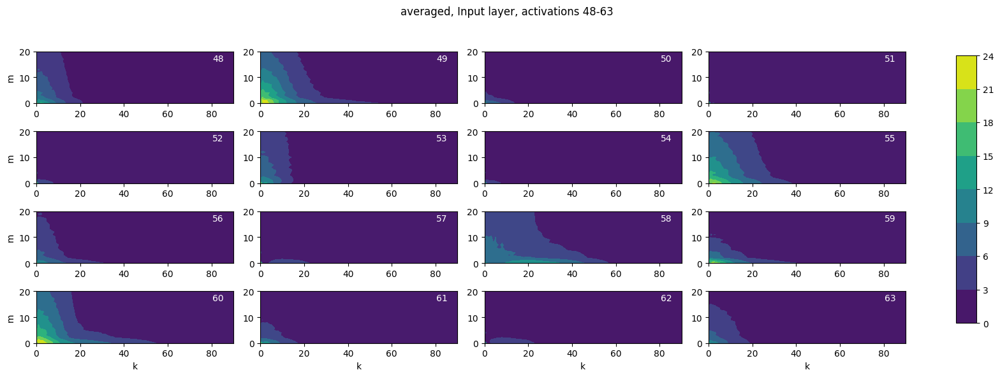

In [65]:
subp = 64
num_figures = subp // 16  # Create 4 figures with 16 subplots each

data_freq = np.fft.rfftfreq(data.shape[-1], d = 1/data.shape[-1])  # how many cycles along the equator

for fig_index in range(num_figures):
    fig, axs = plt.subplots(4, 4, figsize=(16, 6))
    fig.suptitle(f'averaged, Input layer, activations {fig_index * 16}-{fig_index * 16 + 15}')

    for i, ax in enumerate(axs.flat):
        subplot_index = fig_index * 16 + i

        pw_fft = av_input_layer_fft[subplot_index].squeeze() 

        # im = ax.contourf(data_freq, np.arange(20, -22, -2), pw_fft)

        if mflg=='off':
            im = ax.contourf(data_freq, np.arange(20, -22, -2), pw_fft)
            # Set shared x and y labels for all subplots
            if i % 4 == 0:
                ax.set_ylabel('latitude')
            if i >= 12:
                ax.set_xlabel('k')
        else:
            # im = ax.contourf(data_freq[:10], np.arange(int(len(y)/2)), pw_fft[:10,:int(len(y)/2)])
            im = ax.contourf(data_freq[:], np.arange(len(y)), pw_fft[:,:])

            # Set shared x and y labels for all subplots
            if i % 4 == 0:
                ax.set_ylabel('m')
            if i >= 12:
                ax.set_xlabel('k')

        # Mark the subplot with its index
        ax.text(0.95, 0.95, f'{subplot_index}', transform=ax.transAxes, ha='right', va='top', color='white')

    # Create a separate axis for the colorbar with adjusted width
    cax = fig.add_axes([0.94, 0.15, 0.02, 0.7])  # Adjust the position and width as needed

    fig.colorbar(im, cax=cax, orientation='vertical')

    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    plt.show()

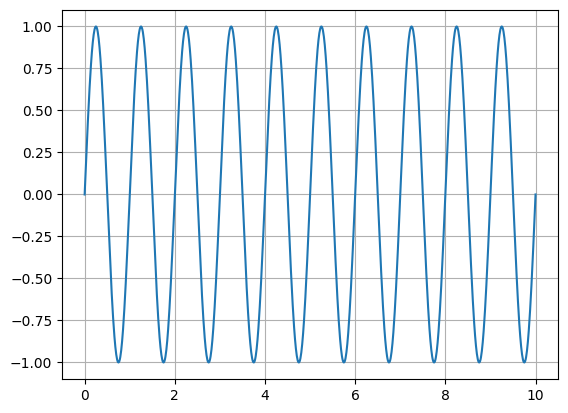

In [34]:
x = np.linspace(0, 10, 1000)
y = np.sin(2*x*np.pi)

plt.plot(x,y)
plt.grid(visible=True)

In [35]:
y_fft = np.fft.rfft(y)

In [36]:
y_fft.shape

(501,)

In [37]:
x_fft = np.fft.rfftfreq(len(y), d=1/len(y))
# y_fft = np.fft.fftshift(y_fft)

/global/homes/l/linyaoly/.conda/envs/eofenv/lib/python3.9/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


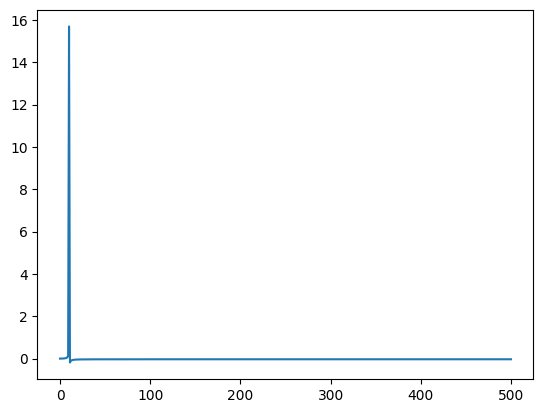

In [38]:
plt.plot(x_fft, y_fft)

In [6]:
max(y_fft)

(3.1692199106336816e-15+3.552713678800501e-15j)

In [32]:
a = 1 + 1j
a

(1+1j)

In [33]:
np.abs(a)

1.4142135623730951